<a href="https://colab.research.google.com/github/torbenbillow/CBS-AML-PROJECT/blob/main/notebooks/01_price_target.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The intention of the following machine learning model is to provide Airbnb hosts with a real-time, automated pricing suggestion tool, based on a property's entered attributes (e.g., location, number of beds, amenities). The model will run as the last step of creating a new listing, after all details except price have been entered. Once the model outputs a price suggestion, the host can override it if she chooses.

The source data is a point-in-time scrape of Airbnb listings in Copenhagen from June 2025. Our core assumption is that a given property's listed price, after filtering for active listings (see "FILTER LISTINGS FOR MORE INFORMATIVE DATA" section below), generally reflects a reasonable market value given the property's characteristics. We recognize that this is not always the case, and the model will thereby learn from listings with potentially inflated prices (relative to their peers) or low occupancy.

In an ideal scenario, a more robust training target would be based on historical, "successful" listings; that is, those with a high, sustained occupancy rate. Access to historical booking and occupancy data would provide a more trustworthy baseline for predicting optimal (profitable) prices, rather than just current listed prices.

# IMPORT LIBRARIES FOR DATA PROCESSING AND CLEANSING

In [70]:
import pandas as pd
import numpy as np

from google.colab import drive
pd.options.mode.copy_on_write = True   # Make sure that when copies are made, the original object isn't subsequently updated

# LOAD DATA FROM GOOGLE DRIVE *[CHANGE TO LOCAL FILE BEFORE HAND-IN]*

The raw Airbnb data on Copenhagen was sourced from the following website: https://insideairbnb.com/get-the-data/. It is a scrape from June, 2025.

In [71]:
print("Loading raw data from Google Drive location...\n")
file_id = "1Iyr7zX8u0gKWKUWCSgZUpcvbTuYBmw1V"             # File id from Google Drive
url = f"https://drive.google.com/uc?id={file_id}"         # URL to Google Sheet with the inputted file_id
listings_raw = pd.read_csv(url)                           # Store the data in the "listings_raw" variable

print("Raw data successfully loaded.\n")
print("Raw dataframe shape:",listings_raw.shape)          # Print the shape of the dataframe so we have a baseline

Loading raw data from Google Drive location...

Raw data successfully loaded.

Raw dataframe shape: (22684, 79)


# DATA CLEANSING

The below data cleansing process proved to be highly iterative and dependent on intermediate results. Initial decisions to drop or impute certain attributes often created overlaps, or rendered subsequent activities unnecessary due to the high correlation of missing or "bad" data. Several cleansing activities (such as the choice to filter out inactive listings) were reworked after examining the training cross-validation results of the baseline models, creating a feedback loop between feature engineering and model performance.

To ensure the integrity of the model and prevent data leakage, no inter-row imputations were performed. Prior to establishing the Scikit-learn pipeline and column transformer, only intra-row imputations were calculated (see "CLEAN UP "bedroom" AND "bed" ATTRIBUTES" section below), such that statistics would not be derived including the test set. Scaling and onehot encoding are encapsulated in the pipeline for consistency, reproducibility, and to ensure that statistics like standard deviation and mean are being calculated only on the training data.  

The biggest challenge with deploying this model in production (that is, as a feature of the Airbnb application, being fed by the live stream of host-entered data) would be to format and cleanse the real-time data. It would be crucial to ensure that the data cleansing steps and model pipelines were build to handle unexpected values. However, this is mitigated by the following:

1.   Mandatory Fields: Required fields should be marked as such to prevent missing data.
2.   Data Integrity Requirements: Data types should be enforced to prevent unexpected values.
3.   The OneHotEncoder in the pipeline must be configured with handle_unknown='ignore' to process new categorical values like room or property types.

## DISPLAY ALL RAW DATA COLUMNS AND MANUALLY REMOVE UNWANTED COLUMNS

In the code blocks below, we inspect the various columns present in the original data set and elect to drop a number of them. We have, for example, made the determination that a number of columns are irrelevant for price prediction (domain knowledge), others are completely empty and thus provide no value, and a handfull display elements of multicollinearity and are thereby removed. All reasons are noted as comments in the code.

In [72]:
# Copy the original dataframe to the df variable, so the original data set can be used for comparisons
df = listings_raw.copy()

# List all columns
pd.set_option('display.max_rows', None)
display(pd.DataFrame({"column_name": df.columns}))

,column_name
0,id
1,listing_url
2,scrape_id
3,last_scraped
4,source
5,name
6,description
7,neighborhood_overview
8,picture_url
9,host_id


In [73]:
# The following columns are irrelevant, and thus, we have chosen to drop them.
df = df.drop(columns=["listing_url","scrape_id","source","host_id","host_url",
                      "calendar_last_scraped","first_review","host_neighbourhood"])

# The following columns could impact a listing's "success" (guests may discriminate based on
# a name or picture, for example), but due to the complexity of including them, and the scope
# of this project, we have chosen to drop them.

# However, we recognize that dropping the column does NOT prevent the model from learning the
# underlying bias through proxy features (indirect discrimination). If there truly is discrimination,
# it is already baked into the observed booking and pricing patterns in our training data.
df = df.drop(columns=["name","picture_url","host_name","host_thumbnail_url","host_picture_url"])

# Dropping the following columns in favor of "calculated_host_listings_count," because that is
# the direct calculation of how many listings a host has at the time of scrape. The metadata
# also notes that the following calculations are "unknown," and thereby less trustworthy.
df = df.drop(columns=["host_listings_count","host_total_listings_count"])

# Dropping in favor of "host_identitity_verified," which is a boolean that indicates whether
# or not the host is verified.
df = df.drop(columns=["host_verifications"])

# Dropping in favor of "neighborhood_cleansed."
df = df.drop(columns=["neighbourhood"])

# Dropping the following, as they are completely empty attributes.
df = df.drop(columns=["neighbourhood_group_cleansed","calendar_updated","license"])

# Dropping the following columns in favor of "mini_nights" and "maximum_nights."
df = df.drop(columns=["minimum_minimum_nights","maximum_minimum_nights","minimum_maximum_nights",
                      "maximum_maximum_nights","minimum_nights_avg_ntm","maximum_nights_avg_ntm"])

# Dropping the following columns, because there is no information about they represent.
df = df.drop(columns=["has_availability","availability_eoy"])

# Dropping the following columns in favor "number_of_reviews" for simplicity.
df = df.drop(columns=["number_of_reviews_ltm","number_of_reviews_l30d"])

# Dropping in favor "number_of_reviews" for simplicity.
df = df.drop(columns=["number_of_reviews_ly"])

# Irrelevant and would introduce data leakage.
df = df.drop(columns=["estimated_revenue_l365d"])

# Dropping the following attributes because they will not be available at the time of prediction.
df = df.drop(columns=["review_scores_rating","review_scores_accuracy","review_scores_cleanliness",
                      "review_scores_checkin","review_scores_communication","review_scores_location",
                      "review_scores_value","availability_30","availability_60","availability_90",
                      "availability_365"])

# Dropping the following columns in favor of "calculated_host_listings_count" for simplicity.
df = df.drop(columns=["calculated_host_listings_count_entire_homes","calculated_host_listings_count_private_rooms",
                      "calculated_host_listings_count_shared_rooms"])

# Dropping in favor of "number_of_reviews."
df = df.drop(columns=["reviews_per_month"])

In [74]:
# Print size of dataframe before drops
print("Dataframe shape before column drops:",listings_raw.shape,"\n")
# Print size of dataframe after drops
print("Dataframe shape after column drops:",df.shape,"\n")
# Print number of columns and rows dropped
print("Number of columns removed:",listings_raw.shape[1] - df.shape[1],"\n")
print("Number of rows removed:",listings_raw.shape[0] - df.shape[0])

Dataframe shape before column drops: (22684, 79) 

Dataframe shape after column drops: (22684, 32) 

Number of columns removed: 47 

Number of rows removed: 0


## AUDIT THE DATA TO DETERMINE WHICH ATTRIBUTES REQUIRE CLEANSING

The code below defines a function that prints a range of information about our data set. This provides us with a systematic approach to auditing the data and making necessary corrections.

This function will be called again after data cleansing steps have been taken to validate that the data is ready for modeling.



In [75]:
# Create a function that will audit the data and provide an overview, making it easier to systematically determine what needs to be cleansed.

def audit_dataframe(df, name="DataFrame"):
    print(f"\n=== AIRBNB DATA AUDIT: {name} ===\n")
    print(f"Shape: {df.shape[0]} rows × {df.shape[1]} columns\n")

    # ----- SHOW NULL SUMMARY -----
    print("---- Missing Values ----")
    nulls = df.isnull().sum()
    nulls_percent = (df.isnull().mean() * 100).round(2)
    null_summary = pd.DataFrame({
        "null_count": nulls,
        "null_percent": nulls_percent,
        "dtype": df.dtypes
    })
    display(null_summary[nulls > 0].sort_values("null_percent", ascending=False))
    print("\n")

    # ----- SHOW DATA TYPES -----
    print("---- Data Types ----")
    data_types = df.dtypes.rename("dtype").to_frame()
    display(data_types)

    print("\n")

    # ----- SHOW DESCRIPTIVE STATS -----
    print("---- Descriptive Statistics (Numerical) ----")
    display(df.describe(include=[np.number]).transpose().round(2))
    print("\n")

    print("---- Descriptive Statistics (Categorical) ----")
    display(df.describe(include=['object', 'category']).transpose())
    print("\n")

    # ----- SHOW UNIQUE VALUES -----
    print("---- Unique Value Counts ----")
    unique_counts = (df.nunique().sort_values().rename("unique_counts").to_frame())
    display(unique_counts)
    print("\n")

    # ----- SHOW BOOLEAN DISTRIBUTION -----
    print("---- Boolean Column Distributions ----")
    bool_cols = df.select_dtypes(include=["bool","boolean"]).columns
    if len(bool_cols) > 0:
        bool_summary = []

        for col in bool_cols:
            vc = df[col].value_counts(dropna=False)
            true_count = vc.get(True, 0)
            false_count = vc.get(False, 0)
            na_count = vc.get(pd.NA, 0) if "boolean" in str(df[col].dtype) else 0
            total = len(df[col])

            bool_summary.append({
                "column": col,
                "dtype": df[col].dtype,
                "true_count": true_count,
                "false_count": false_count,
                "na_count": na_count,
                "true_percent": round(true_count / total * 100, 2),
                "false_percent": round(false_count / total * 100, 2),
                "na_percent": round(na_count / total * 100, 2),
            })

        display(pd.DataFrame(bool_summary))

    else:
        print("NO BOOLEAN COLUMNS FOUND")

    print("\n")

    # ----- SHOW CATEGORICAL CARDINALITY -----
    print("---- Categorical Cardinality ----")

    cat_cols = df.select_dtypes(include=["object", "category"]).columns

    cardinality_df = pd.DataFrame({
        "column": cat_cols,
        "unique_values": [df[col].nunique() for col in cat_cols]
    })
    display(cardinality_df)
    print("\n")

    # ----- SHOW DUPLICATES -----
    print("---- Duplicate Rows ----")

    dupes = df.duplicated().sum()
    duplicate_df = pd.DataFrame({"duplicate_rows": [dupes]})
    display(duplicate_df)
    print("\n")

    # ----- SHOW SAMPLE VALUES FOR EACH COLUMN -----
    print("---- Sample Values ----")
    pd.set_option('display.max_columns', None)
    display(df.sample(5))
    print("\n")

    print("=== END AUDIT ===\n")


In [76]:
# Run the function to show the metrics

audit_dataframe(df, name="Airbnb Data")


=== AIRBNB DATA AUDIT: Airbnb Data ===

Shape: 22684 rows × 32 columns

---- Missing Values ----


,null_count,null_percent,dtype
neighborhood_overview,14459,63.74,object
host_about,13381,58.99,object
bathrooms,8858,39.05,float64
beds,8856,39.04,float64
price,8853,39.03,object
host_response_time,7853,34.62,object
host_response_rate,7853,34.62,object
host_acceptance_rate,5288,23.31,object
host_location,4082,18.00,object
last_review,3146,13.87,object




---- Data Types ----


,dtype
id,int64
last_scraped,object
description,object
neighborhood_overview,object
host_since,object
host_location,object
host_about,object
host_response_time,object
host_response_rate,object
host_acceptance_rate,object




---- Descriptive Statistics (Numerical) ----


,count,mean,std,min,25%,50%,75%,max
id,22684.0,6.582521e+17,5.448303e+17,29118.00,36348049.75,7.954608e+17,1.157326e+18,1.451628e+18
latitude,22684.0,5.568000e+01,2.000000e-02,55.62,55.67,5.568000e+01,5.570000e+01,5.573000e+01
longitude,22684.0,1.256000e+01,3.000000e-02,12.45,12.54,1.256000e+01,1.258000e+01,1.264000e+01
accommodates,22684.0,3.330000e+00,1.640000e+00,1.00,2.00,3.000000e+00,4.000000e+00,1.600000e+01
bathrooms,13826.0,1.100000e+00,3.400000e-01,0.00,1.00,1.000000e+00,1.000000e+00,8.000000e+00
bedrooms,21968.0,1.620000e+00,8.900000e-01,0.00,1.00,1.000000e+00,2.000000e+00,9.000000e+00
beds,13828.0,1.870000e+00,1.270000e+00,0.00,1.00,1.000000e+00,2.000000e+00,1.600000e+01
minimum_nights,22684.0,4.640000e+00,1.778000e+01,1.00,2.00,3.000000e+00,4.000000e+00,1.111000e+03
maximum_nights,22684.0,3.055400e+02,3.767400e+02,1.00,20.00,9.000000e+01,3.650000e+02,1.125000e+03
number_of_reviews,22684.0,1.893000e+01,4.594000e+01,0.00,2.00,7.000000e+00,1.900000e+01,2.366000e+03




---- Descriptive Statistics (Categorical) ----


,count,unique,top,freq
last_scraped,22684,6,2025-07-01,6401
description,22070,21430,Your family will be close to everything when y...,52
neighborhood_overview,8225,7901,This area is known for its mix of restaurants ...,11
host_since,22155,4729,2018-05-03,251
host_location,18602,333,"Copenhagen, Denmark",15966
host_about,9303,7736,Vi udlejer møblerede lejligheder og har mere e...,247
host_response_time,14831,4,within an hour,5742
host_response_rate,14831,91,100%,10528
host_acceptance_rate,17396,101,100%,4924
host_is_superhost,22446,2,f,19672




---- Unique Value Counts ----


,unique_counts
host_is_superhost,2
host_identity_verified,2
host_has_profile_pic,2
instant_bookable,2
room_type,4
host_response_time,4
last_scraped,6
bedrooms,10
bathrooms,11
neighbourhood_cleansed,11




---- Boolean Column Distributions ----
NO BOOLEAN COLUMNS FOUND


---- Categorical Cardinality ----


,column,unique_values
0,last_scraped,6
1,description,21430
2,neighborhood_overview,7901
3,host_since,4729
4,host_location,333
5,host_about,7736
6,host_response_time,4
7,host_response_rate,91
8,host_acceptance_rate,101
9,host_is_superhost,2




---- Duplicate Rows ----


,duplicate_rows
0,0




---- Sample Values ----


,id,last_scraped,description,neighborhood_overview,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,estimated_occupancy_l365d,last_review,instant_bookable,calculated_host_listings_count
3598,22062461,2025-07-02,This lovely 65 square meter apartment is locat...,The apartment is located just outside central ...,2014-10-11,"Copenhagen, Denmark",NaN,within an hour,100%,100%,f,t,t,Vanlse,55.695290,12.503080,Entire guest suite,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Wifi"", ""Stove"", ""Oven"", ""Hot water"", ""Baby b...",$993.00,3,180,98,24,2025-06-20,f,1
5077,33234294,2025-07-01,Super nice and bright apartment. Spacious with...,NaN,2017-06-16,"Copenhagen, Denmark",NaN,within an hour,100%,84%,f,t,f,Nrrebro,55.698300,12.548660,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,NaN,"[""Shampoo"", ""Essentials"", ""Heating"", ""Carbon m...",NaN,2,730,20,72,2025-06-09,f,1
6737,43984357,2025-06-28,Want to stay close to Copenhagen but without n...,It is a very sought after residential neighbor...,2018-06-28,NaN,Jeg bor med min mand og mine to søde drenge på...,within a day,100%,75%,f,t,t,Vanlse,55.689110,12.499170,Entire villa,Entire home/apt,6,2.0,2 baths,5.0,4.0,"[""Backyard"", ""Freezer"", ""Dedicated workspace"",...","$2,036.00",3,730,13,24,2025-06-01,f,2
4312,26559370,2025-07-01,Welcome to our delightful Vesterbro apartment ...,NaN,2015-06-19,"Copenhagen, Denmark",NaN,within an hour,100%,86%,f,t,t,Vesterbro-Kongens Enghave,55.671520,12.547160,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,NaN,"[""Dedicated workspace"", ""Bathtub"", ""Lockbox"", ...",NaN,4,105,23,32,2025-01-06,f,1
16120,1112833048593728289,2025-06-29,Lovely apartment centrally located right by Ax...,NaN,2023-10-25,NaN,NaN,within a few hours,88%,53%,f,t,t,Frederiksberg,55.686974,12.535156,Entire condo,Entire home/apt,3,1.0,1 bath,1.0,2.0,"[""Freezer"", ""Single oven"", ""Hot water"", ""Centr...","$1,040.00",5,60,4,40,2024-10-31,f,1




=== END AUDIT ===



# FILTER LISTINGS FOR MORE INFORMATIVE DATA



As mentioned in the data cleansing introduction section, we took an iterative approach to filtering out certain listings while building our candidate models.

We originally opted to filter out listings with no reviews in 2025 ("last_review >= '2025-01-01') and no occupancy in the last year (estimated_occupancy_l365d > 0). Our goal was to narrow down the training data to more accurate, insightful listings. Upon further review, we realized that this filter might introduce selection bias by inadvertently excluding genuinely new listings that lacked reviews or booking history. The goal of a price prediction model is to serve new listings, and a biased model could perform poorly for these listings.

We subsequently discovered, however, that including this filter significantly increased the quality of our data and reduced noise, as evidenced by the poor results of the models trained on the unfiltered data (see appendix comparing results).

Based on the stark contrast in results, our hypothesis is that filtering the dataset removed:

1.   Stale Listings: Properties that haven't been updated or booked in over a year. The price may be irrelevant or outdated.
2.   Test/Draft Listings: Properties set up with arbitrary prices (e.g., 1 DKK or 10,000 DKK) that are not active in the market

While the filter technically removes new listings, the overall signal-to-noise ratio improved dramatically, as the remaining listings provide a much more accurate representation of the active, correctly priced market. Therefore, the benefit of training on clean, relevant data outweighs the minimal theoretical selection bias, as the excluded listings proved to be misleading data points. In essence, we were avoiding the "garbage in, garbage out" effect.

In [77]:
df = df.query(
    "last_review >= '2025-01-01' and estimated_occupancy_l365d > 0"
)

In [78]:
# Check sizes of data and filtered data
print("Row count before filtering:", len(listings_raw))
print("Row count after filtering:", len(df))

Row count before filtering: 22684
Row count after filtering: 10132


In [79]:
# Drop the aforementioned columns, as they are no longer needed post-filtering
df = df.drop(columns=["last_review","estimated_occupancy_l365d"])

## CLEAN UP BOOLEAN COLUMNS

As shown in the data audit, none of the boolean columns are of boolean type. We will convert the columns to "boolean" later, but in the following code, we are mapping the various values from the original data set to 0s and 1s.

In [80]:
bool_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]

bool_map = {
    "t": 1,
    "f": 0,
    "true": 1,
    "false": 0,
    True: 1,
    False: 0,
}

# Assign "Int64" datatype for now
for col in bool_cols:
   df[col] = (df[col].map(bool_map).astype("Int64"))

# Print results
results = pd.DataFrame({
    "column": bool_cols,
    "dtype": [df[col].dtype for col in bool_cols],
    "unique_values": [df[col].unique().tolist() for col in bool_cols]
})
display(results)

,column,dtype,unique_values
0,host_is_superhost,Int64,"[1, 0, <NA>]"
1,host_has_profile_pic,Int64,"[1, <NA>, 0]"
2,host_identity_verified,Int64,"[1, 0, <NA>]"
3,instant_bookable,Int64,"[0, 1]"


## CLEAN UP "bedroom" AND "bed" ATTRIBUTES

The data audit revealed that the "bedrooms" and "beds" attributes have missingness. The "beds" attribute is particularly significant, as it contains a null value in 2,261 listings.

We considered imputing values for these attributes by calculating guests per bed, beds per bedroom, and guests per bedroom, and then deriving averages to fill the null values accordingly. However, since these calculations would be based on statistics like mean and median from the entire dataset (prior to the training/test split), this approach would introduce leakage. Effectively, we would be including information from the (future) test set and using it to impute values in the (future) training set.

This would give our model information about the test data's distribution, theoretically causing it to perform better in cross-validation than it would on truly unseen data.

As such, we have decided to perform a more simple imputation that doesn't consider statistics across the entire data set (inter-row). We have instead opted for the simple assumption that on average, there is 1 bed per bedroom. This imputation will therefore rely only on intra-row data, and will therefore avoid leakage.

In [81]:
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,158
beds,2261


In [82]:
# Drop rows where "bedrooms" is null, as it's a relatively small percentage
df = df.dropna(subset=['bedrooms'])

# Re-check missingness
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,0
beds,2104


In [83]:
# Set beds = bedrooms. As discussed in the text field above, we are assuming that on average, there is 1 bed per bedroom
df.loc[df['beds'].isna(), 'beds'] = df['bedrooms']

In [84]:
# Re-check missingness
display(df[['accommodates','bedrooms','beds']].isna().sum().rename("null_counts"))

,null_counts
accommodates,0
bedrooms,0
beds,0


## CLEAN UP "bathroom" AND "bathroom_text" ATTRIBUTES

2,105 properties are missing a number of bathrooms in the "bathrooms" attribute. For all but 2 of these properties, the number of bathrooms is stored as a string in the "bathrooms_text" attribute. As such, we are parsing the "bathrooms_text" feature to extraxt the number of bathrooms.

In [85]:
print("Check null counts:\n")
display(df[["bathrooms", "bathrooms_text"]].isna().sum().to_frame(name="null_count"))
print("\n")
print("Show top 10 examples where \"bathrooms\" is null:\n")
display(df.loc[df["bathrooms"].isna(),["bathrooms","bathrooms_text"]].head(10))
print("\n")
print("Show examples where \"bathrooms_text\" contains \"half-bath\" and \"bathrooms\" is null:\n")
mask = (
    df["bathrooms_text"].astype(str).str.contains("half", case=False, na=False)
    & df["bathrooms"].isna()
)
display(df.loc[mask, ["bathrooms","bathrooms_text"]])

Check null counts:



,null_count
bathrooms,2105
bathrooms_text,2




Show top 10 examples where "bathrooms" is null:



,bathrooms,bathrooms_text
7,NaN,1.5 baths
9,NaN,1.5 baths
38,NaN,1 bath
44,NaN,1 bath
54,NaN,1 bath
61,NaN,1 bath
83,NaN,1 bath
98,NaN,1 bath
106,NaN,NaN
112,NaN,2 baths




Show examples where "bathrooms_text" contains "half-bath" and "bathrooms" is null:



,bathrooms,bathrooms_text
2659,NaN,Half-bath
2844,NaN,Half-bath
3617,NaN,Half-bath
3692,NaN,Half-bath
4605,NaN,Half-bath
5559,NaN,Half-bath
6068,NaN,Half-bath
10080,NaN,Half-bath
11789,NaN,Half-bath
12143,NaN,Half-bath


In [86]:
# Convert bathrooms_text to string and normalize spacing/casing
bt = df["bathrooms_text"].astype(str).str.lower().str.strip()

# Special case: map any form of "half-bath" to 0.5
half_bath_mask = bt.str.contains("half-bath", na=False)
df.loc[half_bath_mask, "bathrooms"] = 0.5

# Extract numeric values (e.g., "1 bath", "2.5 baths")
bathrooms_from_text = (
    bt.str.extract(r'(\d+(\.\d+)?)')[0]  # capture integers or decimals
    .astype(float)
)

# Fill remaining missing bathroom values using numeric extraction
df["bathrooms"] = df["bathrooms"].fillna(bathrooms_from_text)

In [87]:
print("\"bathrooms\" null count:", df["bathrooms"].isna().sum())
print("\"bathrooms_text\" null count:", df["bathrooms_text"].isna().sum())

"bathrooms" null count: 2
"bathrooms_text" null count: 2


In [88]:
# Drop remaining nulls since there are only 2 instances
df = df.dropna(subset=['bathrooms','bathrooms_text'])

In [89]:
print("\"bathrooms\" null count:", df["bathrooms"].isna().sum())
print("\"bathrooms_text\" null count:", df["bathrooms_text"].isna().sum())

"bathrooms" null count: 0
"bathrooms_text" null count: 0


In [90]:
print("Sanity check - show 15 examples of \"bathroom\" and \"bathroom_text\" fields:\n")
display(df[["bathrooms","bathrooms_text"]].head(15))
print("\n")
print("Sanity check - show 15 examples where \"bathrooms_text\" contained \"half-bath\", and the resulting \"bathrooms\" field:\n")
mask = df["bathrooms_text"].astype(str).str.contains("half", case=False, na=False)
display(df.loc[mask, ["bathrooms","bathrooms_text"]].head(15))

Sanity check - show 15 examples of "bathroom" and "bathroom_text" fields:



,bathrooms,bathrooms_text
2,2.0,2 baths
4,1.0,1 bath
5,2.0,2 baths
7,1.5,1.5 baths
9,1.5,1.5 baths
10,1.0,1 bath
14,1.0,1 bath
16,1.0,1 bath
17,1.0,1 bath
18,1.0,1 shared bath




Sanity check - show 15 examples where "bathrooms_text" contained "half-bath", and the resulting "bathrooms" field:



,bathrooms,bathrooms_text
259,0.5,Private half-bath
960,0.5,Half-bath
2433,0.5,Half-bath
2659,0.5,Half-bath
2844,0.5,Half-bath
3411,0.5,Half-bath
3617,0.5,Half-bath
3692,0.5,Half-bath
3966,0.5,Shared half-bath
3992,0.5,Shared half-bath


In [91]:
# Drop bathrooms_text as we no longer need it
df = df.drop(columns=["bathrooms_text"])

## TRANSFORM "description" ATTRIBUTE BY ADDING "description_missing" AND "description_length" COLUMNS

We have elected to engineer two features, "description_missing" and "description_length," from the raw text in the "description" field. Since performing full text analysis (NLP) is outside the scope of this project, these engineered features serve as proxies for the quality and effort invested in a listing.

We believe the "description_missing" and "description_length" attributes could impact the price a listing commands. We assume that a detailed, present description signals a more professional host, higher quality listing, and greater transparency, all of which correlate with a host's ability to charge a premium price.

In [92]:
# Description has some missing values
print("\"description\" null count:", df["description"].isna().sum())

"description" null count: 180


In [93]:
df['description_missing'] = df['description'].isna().astype(int) # Make flag for missing description
df['description_length'] = df['description'].fillna('').str.len() # Add description length

# Show the results of adding the above columns
print("Sanity check - examples of missing descriptions and the added columns:\n")
display(df[df['description_missing'] == 1][['description', 'description_missing', 'description_length']].head(10))
print("\n")
print("Sanity check - examples of filled out descriptions and the added columns:\n")
display(df[df['description_missing'] == 0][['description', 'description_missing', 'description_length']].head())

Sanity check - examples of missing descriptions and the added columns:



,description,description_missing,description_length
21,NaN,1,0
22,NaN,1,0
33,NaN,1,0
38,NaN,1,0
62,NaN,1,0
76,NaN,1,0
80,NaN,1,0
85,NaN,1,0
96,NaN,1,0
107,NaN,1,0




Sanity check - examples of filled out descriptions and the added columns:



,description,description_missing,description_length
2,You enter a narrow entrance and feel the good ...,0,482
4,It doesn't get more central than this. Histori...,0,412
5,"Big, bright, airy and attractive apartment dec...",0,75
7,Welcome to our home with a view of the Lakes. ...,0,558
9,"Beautiful, spacious (140m2/1506sqft) and brigh...",0,471


In [94]:
# Drop the "description" attribute, as we no longer need it
df = df.drop(columns=["description"])

## TRANSFORM "host_since" ATTRIBUTE BY ADDING "host_tenure_days" COLUMN

We engineered the feature "host_tenure_days" from the "host_since" date column. By converting the host's start date into a quantifiable number of days, we provide the model with a numerical measure of host experience that it can process, unlike the original date format. We believe that host tenure will serve as a proxy for trust, reliability, and market experience. Longer host tenure likely correlates with established reputation and higher quality service, which are factors that allow a listing to command a premium price.

In [95]:
# Data has a host_since feature, so we use it to create a "host_tenure_days" column
df['host_since'] = pd.to_datetime(df['host_since'], errors='coerce')
latest_scrape = pd.to_datetime(df['last_scraped']).max()                          # Isolate the latest scrape date for calculation
df['host_tenure_days'] = (latest_scrape - df['host_since']).dt.days               # Create new "host_tenure_days" attribute

In [96]:
print("\"host_tenure_days\" null count:", df["host_tenure_days"].isna().sum())

"host_tenure_days" null count: 257


In [97]:
# Drop the remaining nulls for host_tenure_days, as it is a relatively small number.
df = df.dropna(subset=['host_tenure_days'])

In [98]:
print("\"host_tenure_days\" null count:",df["host_tenure_days"].isna().sum())

"host_tenure_days" null count: 0


In [99]:
# Drop "host_since" and "last_scraped" columns, as we no longer need them
df = df.drop(columns=["host_since", "last_scraped"])

In [100]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (9715, 29)


## TRANSFORM "host_about" ATTRIBUTE BY ADDING "host_about_missing" AND "host_about_length" COLUMNS

We have elected to engineer two features, "host_about_missing" and "host_about_length," from the raw text in the "host_about" field. Since performing full text analysis (NLP) is outside the scope of this project, these engineered features serve as proxies for the quality and effort invested in a host's profile, which impacts a listing.

We believe the "host_about_missing" and "host_about_length" attributes could impact the price a listing commands. We assume that a detailed, present host description signals a more professional host, higher quality listing, and greater transparency, all of which correlate with a host's ability to charge a premium price.

In [101]:
# Data has a host_about feature, so we use it to create "host_about_missing" and "host_about_length" columns
df['host_about_missing'] = df['host_about'].isna().astype(int) # Make flag for host about
df['host_about_length'] = df['host_about'].fillna('').str.len() # Host about length

In [102]:
print("\"host_about_missing\" null count:",df["host_about_missing"].isna().sum())
print("\"host_about_length\" null count:",df["host_about_length"].isna().sum())

"host_about_missing" null count: 0
"host_about_length" null count: 0


In [103]:
# Drop the "host_about" attribute, as we no longer need it
df = df.drop(columns=["host_about"])

In [104]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (9715, 30)


## TRANSFORM "host_response_rate" AND "host_acceptance_rate" ATTRIBUTES BY ADDING "host_response_rate_missing" AND "host_acceptance_rate_missing" COLUMNS

We have transformed the "host_response_rate" and "host_acceptance_rate" attributes by engineering two corresponding indicator features: "host_response_rate_missing" and "host_acceptance_rate_missing."

As discussed in the "CLEAN UP "bedroom" AND "bed" ATTRIBUTES" section above, imputing the rates' mean or median values (calculated from the entire population) before the training/test split would introduce leakage. As such, these imputations will be made in the pipeline so the values are calculated from only the training data.

The original percentage value (where not null) still captures the host's actual performance. The new binary indicator (1 if missing, 0 if present) captures the fact that the data itself was unavailable.

In [105]:
# Format as float and add missing flag
for col in ["host_response_rate", "host_acceptance_rate"]:
  temp = df[col].astype(str).str.strip().str.rstrip('%').replace('', np.nan)
  df[col] = pd.to_numeric(temp, errors='coerce')
  df[f"{col}_missing"] = df[col].isna().astype(int)

In [106]:
cols = [
    "host_response_rate",
    "host_response_rate_missing",
    "host_acceptance_rate",
    "host_acceptance_rate_missing"
]

print("Sanity check - show a sample of 5 missing response or acceptance rate")
display(df[df["host_response_rate_missing"] == 1].sample(5)[cols])
display(df[df["host_acceptance_rate_missing"] == 1].sample(5)[cols])
print("\n")
print("Sanity check - show a sample of 5 non-missing response or acceptance rate")
display(df[df["host_response_rate_missing"] == 0].sample(5)[cols])
display(df[df["host_acceptance_rate_missing"] == 0].sample(5)[cols])

Sanity check - show a sample of 5 missing response or acceptance rate


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
11931,NaN,1,NaN,1
926,NaN,1,100.0,0
9776,NaN,1,100.0,0
21108,NaN,1,NaN,1
16008,NaN,1,82.0,0


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
19000,NaN,1,NaN,1
18106,NaN,1,NaN,1
9621,NaN,1,NaN,1
5949,NaN,1,NaN,1
11294,NaN,1,NaN,1




Sanity check - show a sample of 5 non-missing response or acceptance rate


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
18592,100.0,0,76.0,0
1967,100.0,0,100.0,0
10381,10.0,0,24.0,0
18621,100.0,0,71.0,0
15642,100.0,0,83.0,0


,host_response_rate,host_response_rate_missing,host_acceptance_rate,host_acceptance_rate_missing
17478,100.0,0,50.0,0
21993,90.0,0,64.0,0
15868,100.0,0,38.0,0
16002,100.0,0,100.0,0
10167,75.0,0,69.0,0


In [107]:
print("\"host_response_rate\" null count:", df["host_response_rate"].isna().sum())
print("\"host_acceptance_rate\" null count:", df["host_acceptance_rate"].isna().sum())

"host_response_rate" null count: 833
"host_acceptance_rate" null count: 124


As mentioned above, these nulls will be handled in the pipeline to prevent data leakage via imputation.

## TRANSFORM "host_response_time" ATTRIBUTE BY ADDING A CATEGORY FOR MISSING VALUES CALLED "unknown"

The "response_time" attribute is categorical, meaning there is a discrete list of options. We have elected to fill null values with a new category called "unknown." This strategy prevents the loss of observations while treating the missingness itself as a meaningful, distinct signal that the model can explicitly learn from, rather than assuming the missing data is equivalent to one of the existing, defined categories.

In [108]:
# Fill missing response time with new category "unknown"
df['host_response_time'] = df['host_response_time'].fillna('unknown')

In [109]:
print("Sanity check - display sample of rows where \"host_response_time\" was null:")
display(df[df["host_response_time"] == "unknown"].sample(5))
print("\n")

print("Sanity check - display sample of rows where \"host_response_time\" was not null:")
display(df[df["host_response_time"] != "unknown"].sample(5))

Sanity check - display sample of rows where "host_response_time" was null:


,id,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing
18922,1240027951202897647,NaN,"Copenhagen, Denmark",unknown,NaN,NaN,0,1,1,Nrrebro,55.693553,12.544068,Entire condo,Entire home/apt,2,1.0,1.0,1.0,"[""Freezer"", ""Hot water"", ""Carbon monoxide alar...",$810.00,1,365,6,0,1,0,529,2339.0,1,0,1,1
1482,6991105,We're a couple of minutes' walking away from T...,"Copenhagen, Denmark",unknown,NaN,65.0,1,1,1,Vesterbro-Kongens Enghave,55.673400,12.562760,Entire condo,Entire home/apt,5,1.0,2.0,3.0,"[""Backyard"", ""Freezer"", ""Hot water"", ""Hair dry...","$2,284.00",3,20,66,0,1,0,195,4645.0,0,127,1,0
17772,1183777311188399022,NaN,"Copenhagen, Denmark",unknown,NaN,60.0,0,1,0,Frederiksberg,55.677472,12.555157,Entire rental unit,Entire home/apt,2,1.0,1.0,1.0,"[""Shared backyard"", ""Refrigerator"", ""Dishwashe...",NaN,4,365,2,0,1,0,476,3135.0,1,0,1,0
16871,1151922588146797271,NaN,"Copenhagen, Denmark",unknown,NaN,100.0,0,1,1,Frederiksberg,55.667914,12.531021,Entire rental unit,Entire home/apt,3,1.0,2.0,2.0,"[""Freezer"", ""Hot water"", ""Iron"", ""Central heat...","$1,084.00",2,365,9,0,1,0,486,3825.0,0,387,1,0
15421,1063615154819433262,"Frederiksberg, an independent municipality wit...","Odense, Denmark",unknown,NaN,33.0,0,1,1,Frederiksberg,55.681776,12.509393,Entire condo,Entire home/apt,4,1.0,1.0,1.0,"[""Bathtub"", ""Dining table"", ""Lockbox"", ""Fire e...",NaN,2,365,7,0,1,0,532,3361.0,0,318,1,0




Sanity check - display sample of rows where "host_response_time" was not null:


,id,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing
6083,39211953,NaN,"Copenhagen, Denmark",within an hour,100.0,83.0,0,1,1,Amager st,55.665340,12.617540,Private room in rental unit,Private room,1,1.0,1.0,1.0,"[""Backyard"", ""Dedicated workspace"", ""Hot water...",$352.00,2,365,22,1,1,1,0,2370.0,0,97,0,0
20842,1382679629010721562,NaN,"Copenhagen, Denmark",within a day,100.0,67.0,0,1,1,Frederiksberg,55.671251,12.535248,Entire rental unit,Entire home/apt,7,1.0,2.0,5.0,"[""TV"", ""Outdoor dining area"", ""Piano"", ""Washer...","$2,925.00",3,365,1,0,1,0,497,3345.0,1,0,0,0
7672,50967103,The apartment is located in the attractive nei...,"Copenhagen, Denmark",within an hour,100.0,95.0,1,1,1,Nrrebro,55.698280,12.546710,Entire condo,Entire home/apt,2,1.0,1.0,1.0,"[""Dining table"", ""Essentials"", ""Dishes and sil...",NaN,3,1125,36,1,1,1,0,4271.0,0,274,0,0
17107,1160748294235408250,NaN,"Copenhagen, Denmark",within a few hours,100.0,83.0,0,1,1,Nrrebro,55.696224,12.546308,Entire condo,Entire home/apt,4,1.0,2.0,2.0,"[""Wifi"", ""Stove"", ""Oven"", ""Dedicated workspace...","$2,000.00",3,365,4,0,2,0,497,4575.0,1,0,0,0
3086,18991805,NaN,"Køge, Denmark",within a few hours,100.0,100.0,1,1,1,Valby,55.663277,12.509426,Entire condo,Entire home/apt,4,1.0,1.0,1.0,"[""Dedicated workspace"", ""Dining table"", ""Lockb...",NaN,7,365,15,0,1,0,454,3136.0,1,0,0,0


## TRANSFORM "neighborhood_overview" ATTRIBUTE BY ADDING "neighborhood_overview_length" AND "neighborhood_overview_missing" COLUMNS

We have elected to engineer two features, "neighborhood_overview_length" and "neighborhood_overview_missing," from the raw text in the "neighborhood_overview" field. Since performing full text analysis (NLP) is outside the scope of this project, these engineered features serve as proxies for the quality and effort invested in a listing.

We believe the "neighborhood_overview_missing" and "neighborhood_overview_length" attributes could impact the price a listing commands. We assume that a detailed, present neighborhood overview signals a more professional host, higher quality listing, and greater transparency, all of which correlate with a host's ability to charge a premium price.

In [110]:
# Data has a "neighborhood_overview" feature, so we use it to create "neighborhood_overview_length"
# and "neighborhood_overview_missing" columns
df['neighborhood_overview_missing'] = df['neighborhood_overview'].isna().astype(int)    # Make flag for neighboorhood overview
df['neighborhood_overview_length'] = df['neighborhood_overview'].fillna('').str.len()   # Neighborhood overview length

# Print results
print("\"neighborhood_overview_missing\" null count:",df["neighborhood_overview_missing"].isna().sum())
print("\"neighborhood_overview_length\" null count:",df["neighborhood_overview_length"].isna().sum())

"neighborhood_overview_missing" null count: 0
"neighborhood_overview_length" null count: 0


In [111]:
# Drop the "neighborhood_overview" attribute, as it is no longer needed
df = df.drop(columns=["neighborhood_overview"])

In [112]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (9715, 33)


## TRANSFORM "host_location" ATTRIBUTE BY ADDING "host_location_missing" COLUMN



A missing host location may be an informative signal that indicates a host's reluctance to share their information, an oversight, or a non-standard account setup. By creating this binary feature, we allow the model to learn a separate coefficient for listings where this information is unavailable, capturing the potential price penalty or premium associated with this specific type of missing data.

We then elected to drop the original "host_location" column from the final feature set for the following reasons.

1.   To mitigate the risk of direct bias: The model cannot learn to directly penalize or reward a listing based solely on the value of the host's location. *However, we recognize that dropping the column does NOT prevent the model from learning the underlying bias (if any) through proxy features (indirect discrimination).*
2.   The informative signal of missingness is already captured.

In [113]:
df['host_location_missing'] = df['host_location'].isna().astype(int) # Make flag for host location

# Print results
print("\"host_location_missing\" null count:",df["host_location_missing"].isna().sum())

"host_location_missing" null count: 0


In [114]:
# Drop the "host_location" attribute, as it is no longer needed
df = df.drop(columns=["host_location"])

In [115]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (9715, 33)


## CLEAN UP "host_has_profile_pic" AND "host_identity_verified" AND "host_is_superhost" ATTRIBUTES

We have elected to simply drop rows that are missing "host_is_superhost," since there are only 93.

In [116]:
display(df[["host_has_profile_pic","host_identity_verified","host_is_superhost"]].isna().sum().rename("null_count"))

,null_count
host_has_profile_pic,0
host_identity_verified,0
host_is_superhost,93


In [117]:
# Drop rows without "host_is_superhost" since the number is relatively small
df = df.dropna(subset=["host_is_superhost"])
print("\"host_is_superhost\" null count:",df["host_is_superhost"].isna().sum())

"host_is_superhost" null count: 0


## AMENITIES WRANGLING: MAKE DUMMIES FOR MOST IMPORTANT AMENITIES

We have elected to narrow down the list of amenities to ones present in this official list from Airbnb: https://sv.airbnb.com/resources/hosting-homes/a/the-amenities-guests-want-25

Creating dummie variables for all possible amenities would explode the feature count and create a lot of noise. Instead, we have chosen to choose the top 10 amenities, according to Airbnb, as input to train our model.

In [118]:
import ast

# Parse once
df["amenities_list"] = df["amenities"].apply(ast.literal_eval)

# Define fuzzy keywords
amenity_keywords = {
    "pool": ["pool"],
    "wifi": ["wifi", "wi-fi", "wi fi", "wireless internet"],
    "parking": ["free parking"],
    "ac": ["air conditioning", "portable heater"],
    "kitchen": ["kitchen"],
    "hot_tub": ["hot tub"],
    "washer": ["washer", "washing machine", "dryer"],
    "self_check_in": ["self check-in"],
    "tv": ["tv", "cable"],
    "grill": ["bbq grill"]
}

blocked_keywords = {
    "dryer": ["hair dryer"],
    "pool": ["pool table"],
    "washer": ["dishwasher"]
}

def has_keywords(amenities, keywords, blocked_keywords=None):
    if blocked_keywords is None:
        blocked_keywords = []

    amenities_lower = " | ".join(str(a).lower() for a in amenities)

    # First: check if a good keyword exists
    good_match = any(k in amenities_lower for k in keywords)

    # If no good keyword, return 0 immediately
    if not good_match:
        return 0

    # If a good keyword exists, we IGNORE blocked keywords
    return 1


for name, keywords in amenity_keywords.items():
    df[f"amenity_{name}"] = df["amenities_list"].apply(
        lambda lst: has_keywords(lst, keywords)
    )


In [119]:
print("Amenity missingness:")
for col in list(amenity_keywords)[0:9]:
    print(col, "missing:", df["amenity_"+col].isna().sum())

print("\nAmenity counts:")
for col in list(amenity_keywords)[0:9]:
    dummy_col = "amenity_" + col
    count_true = (df[dummy_col] == 1).sum()
    print(col, "true:", count_true)


Amenity missingness:
pool missing: 0
wifi missing: 0
parking missing: 0
ac missing: 0
kitchen missing: 0
hot_tub missing: 0
washer missing: 0
self_check_in missing: 0
tv missing: 0

Amenity counts:
pool true: 62
wifi true: 9409
parking true: 1128
ac true: 251
kitchen true: 9351
hot_tub true: 45
washer true: 8710
self_check_in true: 3899
tv true: 7393


In [120]:
# Drop "amenities" and "amenities_list" columns, as they are no longer needed
df = df.drop(columns=["amenities", "amenities_list"])

## CREATE HEX BINS FROM LONG/LAT TO ADD A MORE GRANULAR LOCATION ATTRIBUTE

We have decided to create granular hex bins, as the "neighborhood_cleansed" attribute is fairly broad (values include Vesterbro, Indre By, etc.). We hypothesize that this will improve the accuracy of the model, as Airbnb guests would theoretically be more interested in specific areas than broad neighborhoods, thus driving up the demand (and price) for certain listings.

In [121]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt

# --- 1. Create GeoDataFrame from lat / lon ---

gdf = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df["longitude"], df["latitude"]),
    crs="EPSG:4326"   # WGS84 (lat/lon)
)

# Project to a metric CRS
gdf = gdf.to_crs(epsg=32632)


# --- 2. Helper: build a single regular hexagon around a center ---

def make_hexagon(cx, cy, radius):
    """
    Create a pointy-top regular hexagon centered at (cx, cy)
    with given radius (distance from center to each vertex).
    """
    # Pointy-top: start at 30° and step by 60°
    angles = np.deg2rad(np.arange(0, 360, 60) + 30)
    coords = [(cx + radius * np.cos(a), cy + radius * np.sin(a)) for a in angles]
    return Polygon(coords)


# --- 3. Build a hex grid over the extent of gdf ---

def make_hex_grid(gdf, radius):
    """
    Create a pointy-top hexagon grid covering the extent of gdf.
    radius = distance from hex center to each vertex (in CRS units, e.g. meters).
    """
    xmin, ymin, xmax, ymax = gdf.total_bounds

    # Pointy-top spacing:
    # horizontal distance between centers = sqrt(3) * radius
    # vertical distance between rows = 1.5 * radius
    dx = np.sqrt(3) * radius
    dy = 1.5 * radius

    cols = np.arange(xmin - dx, xmax + dx, dx)
    rows = np.arange(ymin - dy, ymax + dy, dy)

    hexes = []
    for row_idx, cy in enumerate(rows):
        for col_idx, cx in enumerate(cols):
            # Offset every second row by half the horizontal spacing
            cx_shifted = cx + (dx / 2.0 if row_idx % 2 == 1 else 0.0)
            hex_poly = make_hexagon(cx_shifted, cy, radius)
            hexes.append(hex_poly)

    hex_grid = gpd.GeoDataFrame(
        {"hex_id": range(len(hexes))},
        geometry=hexes,
        crs=gdf.crs
    )
    return hex_grid


# --- 4. Generate hex grid + optional trimming ---

hex_radius = 500  # meters
hex_grid = make_hex_grid(gdf, hex_radius)

# Optional trimming to a buffered convex hull of listings
study_area = gdf.geometry.union_all().convex_hull.buffer(2 * hex_radius)
hex_grid = hex_grid[hex_grid.intersects(study_area)].reset_index(drop=True)
hex_grid["hex_id"] = hex_grid.index  # reindex after trimming

# --- 5. Spatial join: assign each listing to a hex ---

joined = gpd.sjoin(
    gdf,
    hex_grid[["hex_id", "geometry"]],
    how="left",
    predicate="within"   # use "intersects" if you see edge-cases
)

# Join hex_id to the original df

df = df.merge(joined[["id", "hex_id"]], on="id")


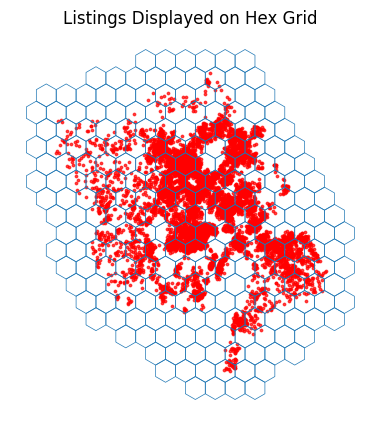

In [122]:
# --- Visualization: check that hexes look like hexes ---

fig, ax = plt.subplots(figsize=(5,5))

# plot hex outlines
hex_grid.boundary.plot(ax=ax, linewidth=0.5)

# plot listing points
gdf.plot(ax=ax, markersize=3, color="red", alpha=0.7)

ax.set_title("Listings Displayed on Hex Grid")
ax.set_axis_off()
plt.show()

In [123]:
# Sanity check the hexbins by projecting them on map of Copenhagen

import folium

# Convert hexes and points to WGS84 (lat/lon)
hex_wgs = hex_grid.to_crs(epsg=4326)
pts_wgs = gdf.to_crs(epsg=4326)

center_lat = pts_wgs.geometry.y.mean()
center_lon = pts_wgs.geometry.x.mean()

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=12.5)

folium.GeoJson(
    hex_wgs,
    name="Hex Grid Displayed on Map",
    style_function=lambda feature: {
        "fillColor": "none",
        "color": "blue",
        "weight": 1,
        "fillOpacity": 0.1,
    },
).add_to(m)

sample_pts = pts_wgs.sample(min(2000, len(pts_wgs)), random_state=0)

for _, row in pts_wgs.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=2,
        color="red",
        fill=True,
        fill_opacity=0.7,
    ).add_to(m)

m

In [124]:
# Count unique hexes assigned to the dataset
print("Unique hex_id:",df["hex_id"].nunique())

# Check for missingness
print("Missing in hex_id:",df["hex_id"].isna().sum())

# Drop id, longitude and latitude since they are not needed anymore
df = df.drop(columns=["id", "longitude", "latitude"])

Unique hex_id: 143
Missing in hex_id: 0


## CLEAN UP "price" ATTRIBUTE



The "price" attribute is our target variable and as seen in the data audit, it is not a float. The following code parses the price to remove special characters and fix the data type.

In [125]:
# Remove $, commas, and spaces, then convert to numeric
price_clean = (
    df["price"]
    .astype(str)                             # handle existing ints / NA
    .str.replace(r'[\$,]', '', regex=True)   # remove $ and commas
    .str.strip()
)

# Convert to numeric, coercing bad values (like '<NA>') to NaN
price_numeric = pd.to_numeric(price_clean, errors="coerce")

# Store back as nullable integer
df["price"] = price_numeric.astype("Int64")

## DROP NULLS FOR PRICE

Since "price" is our target variable, we have chosen to drop rows with null values. We cannot train our supervised models without a target variable, and imputing the target variable would be a major misstep, as it would introduce circular reasoning (training the model to predict its own best guess).

In [126]:
display(df[["price"]].isna().sum().rename("null_count"))

,null_count
price,2055


In [127]:
# Drop null prices, as discussed above
df = df.dropna(subset=['price'])

In [128]:
# Check df shape
print("Data set shape:",df.shape)

Data set shape: (7567, 40)


### VALIDATE PRICE ATTRIBUTE

In [129]:
df["price"].describe()

,price
count,7567.0
mean,1373.065812
std,1178.904303
min,202.0
25%,880.0
50%,1164.0
75%,1600.0
max,63418.0


In [130]:
top_10_prices = df.sort_values(by='price', ascending=False).head(10)
display(top_10_prices)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing,neighborhood_overview_missing,neighborhood_overview_length,host_location_missing,amenity_pool,amenity_wifi,amenity_parking,amenity_ac,amenity_kitchen,amenity_hot_tub,amenity_washer,amenity_self_check_in,amenity_tv,amenity_grill,hex_id
8897,within an hour,99.0,100.0,0,1,1,Frederiksberg,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,63418,1,1125,3,0,247,0,563,2617.0,0,333,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,105
6976,within an hour,99.0,98.0,0,1,1,Nrrebro,Entire rental unit,Entire home/apt,4,1.0,2.0,2.0,40629,1,1125,22,1,39,0,431,1310.0,0,430,0,0,1,0,0,0,1,0,0,1,0,1,1,1,0,152
2123,within an hour,100.0,100.0,1,1,1,Indre By,Entire serviced apartment,Entire home/apt,8,2.0,4.0,4.0,16643,3,60,17,0,5,0,442,3782.0,0,664,0,0,0,419,0,0,1,0,1,1,1,1,1,1,1,124
7320,within an hour,100.0,100.0,1,1,1,Indre By,Entire townhouse,Entire home/apt,6,1.0,3.0,5.0,9810,1,365,12,1,2,0,575,3284.0,0,449,0,0,0,1000,0,0,1,0,1,1,1,1,1,1,1,123
6703,within an hour,100.0,100.0,1,1,1,Indre By,Entire rental unit,Entire home/apt,11,3.0,4.0,6.0,9643,1,365,16,1,4,0,326,4759.0,0,418,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,139
7391,within an hour,100.0,92.0,1,1,1,Indre By,Entire rental unit,Entire home/apt,6,2.0,3.0,3.0,9090,3,365,9,0,7,0,262,679.0,0,445,0,0,1,0,1,0,1,0,0,1,0,1,0,1,0,124
1128,within an hour,100.0,100.0,1,1,1,Indre By,Entire serviced apartment,Entire home/apt,8,2.0,3.0,3.0,8840,1,1125,125,0,5,0,221,3782.0,0,664,0,0,0,422,0,0,1,0,0,1,0,1,1,1,0,124
9091,within a few hours,100.0,98.0,0,1,1,Indre By,Boat,Entire home/apt,16,4.0,9.0,16.0,8743,1,365,2,0,10,0,557,4012.0,1,0,0,0,1,0,0,0,1,0,1,1,0,1,1,1,0,156
3562,within an hour,100.0,96.0,1,1,1,sterbro,Entire rental unit,Entire home/apt,5,2.0,3.0,3.0,7977,3,1125,27,1,1,0,490,4254.0,0,145,0,0,0,90,0,0,1,0,1,1,0,1,0,1,1,168
4338,within a few hours,100.0,73.0,0,1,1,Indre By,Entire rental unit,Entire home/apt,4,2.0,1.0,2.0,7711,2,365,8,0,1,0,569,3089.0,1,0,0,0,0,538,0,0,1,0,0,1,0,1,0,1,1,122


The above price statistics seem to be reasonable. For the high and low ends of the spectrum, we spot checked the listings on Airbnb.

## EXPLORATORY DATA VISUALIZATION



The plots below are intended to visualize the data in such a way that expose patterns and relationships in the data.

The code snippet below shows the price distribution.

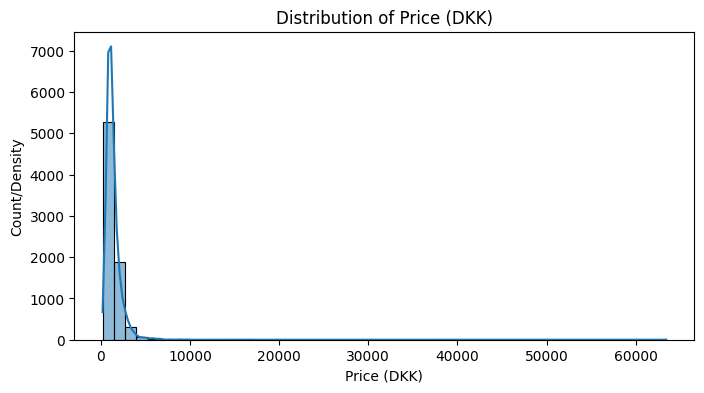

In [131]:
import seaborn as sns

plt.figure(figsize=(8, 4))
sns.histplot(df['price'], kde=True, bins=50)
plt.title('Distribution of Price (DKK)')
plt.xlabel('Price (DKK)')
plt.ylabel('Count/Density')
plt.show()


The following code snippet shows the relationship about various features and price.

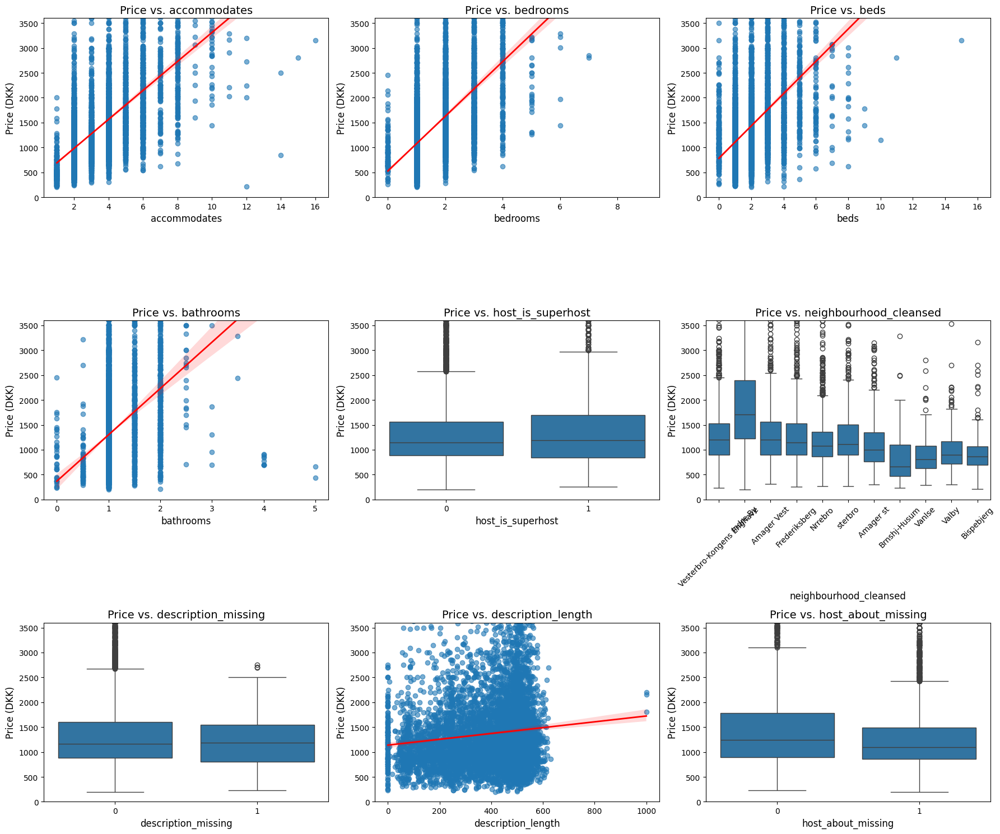

In [132]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define features that we are interested in
features_to_plot = [
    'accommodates',
    'bedrooms',
    'beds',
    'bathrooms',
    'host_is_superhost',       # Treat as categorical/binary if stored as True/False or Yes/No
    'neighbourhood_cleansed',  # Categorical (String)
    'description_missing',     # Categorical/Binary
    'description_length',      # Numerical
    'host_about_missing'       # Categorical/Binary
]

# --- Define the list of CATEGORICAL (String/Boolean) features ---
# These will use the boxplot
CATEGORICAL_FEATURES = [
    'host_is_superhost',
    'neighbourhood_cleansed',
    'description_missing',
    'host_about_missing'
]
# ---------------------------------------------------------------

# Set the subplot grid size
n_features = len(features_to_plot)
n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))

# Calculate the Y-axis upper limit (98th percentile) to handle outliers
price_upper_limit = df['price'].quantile(0.98)


# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5 * n_rows))
axes = axes.flatten()

for i, feature in enumerate(features_to_plot):
    ax = axes[i]

    # --- IF/ELSE to choose plot type based on feature type ---
    if feature in CATEGORICAL_FEATURES:
        # Use BOX PLOT for categorical data (e.g., neighbourhood_cleansed)
        sns.boxplot(
            x=df[feature],
            y=df['price'],
            ax=ax
        )
        # Rotate x-axis labels for readability if categories are long
        if feature == 'neighbourhood_cleansed':
            ax.tick_params(axis='x', rotation=45)
    else:
        # Use REGRESSION PLOT for numerical data (e.g., bedrooms, length)
        sns.regplot(
            x=df[feature],
            y=df['price'],
            ax=ax,
            scatter_kws={'alpha': 0.6},
            line_kws={'color': 'red', 'linewidth': 2}
        )
    # --------------------------------------------------------

    # Set titles and labels
    ax.set_title(f'Price vs. {feature}', fontsize=14)
    ax.set_xlabel(feature, fontsize=12)
    ax.set_ylabel('Price (DKK)', fontsize=12)

    # Limit the Y-axis to focus on the majority of the data
    ax.set_ylim(0, price_upper_limit)

# Hide any unused subplots
for j in range(n_features, n_rows * n_cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## CORRECT DATA TYPES

The following code forces all included attributes into 1 of 4 data types to make subsequent pre-processing steps more streamlined.

In [133]:
# -----------------------
# Define column groups
# -----------------------

# Columns that should be treated as categories
cat_cols = [
    "host_response_time",
    "neighbourhood_cleansed",
    "property_type",
    "room_type",
    "hex_id"
]

# Columns that should be treated as integers (no decimals)
int_cols = [
    "accommodates",
    "bedrooms",
    "beds",
    "minimum_nights",
    "maximum_nights",
    "number_of_reviews",
    "calculated_host_listings_count",
    "description_length",
    "host_about_length",
    "neighborhood_overview_length",
]

# Columns that should be treated as boolean
bool_cols = [
    "description_missing",
    "host_about_missing",
    "host_response_rate_missing",
    "host_acceptance_rate_missing",
    "neighborhood_overview_missing",
    "host_location_missing",
    "amenity_pool",
    "amenity_wifi",
    "amenity_parking",
    "amenity_ac",
    "amenity_kitchen",
    "amenity_hot_tub",
    "amenity_washer",
    "amenity_self_check_in",
    "amenity_tv",
    "amenity_grill",
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable",
]

# Columns that should be treated as floats (allowing decimals)
float_cols = [
    "host_response_rate",
    "host_acceptance_rate",
    "bathrooms",
    "host_tenure_days",
    "price",
]

# -------------------------------------------------
# Make sure beds / bedrooms are ints
# -------------------------------------------------

df["beds"] = df["beds"].round().astype("Int64")
df["bedrooms"] = df["bedrooms"].round().astype("Int64")

# -------------------------------------------------
# Build dtype_map
# -------------------------------------------------

dtype_map = {}

# categories
for c in cat_cols:
    dtype_map[c] = "category"

# boolean
for c in bool_cols:
    dtype_map[c] = "boolean"

# ints (nullable)
for c in int_cols:
    dtype_map[c] = "Int64"

# floats
for c in float_cols:
    dtype_map[c] = "float64"

# -----------------------------------
# Apply all conversions at once
# -----------------------------------

df = df.astype(dtype_map)


## RE-AUDIT THE DATA AFTER CLEANSING

In [134]:
# Run the function to show the various metrics defined

audit_dataframe(df, name="Airbnb Data")


=== AIRBNB DATA AUDIT: Airbnb Data ===

Shape: 7567 rows × 40 columns

---- Missing Values ----


,null_count,null_percent,dtype
host_response_rate,340,4.49,float64
host_acceptance_rate,85,1.12,float64




---- Data Types ----


,dtype
host_response_time,category
host_response_rate,float64
host_acceptance_rate,float64
host_is_superhost,boolean
host_has_profile_pic,boolean
host_identity_verified,boolean
neighbourhood_cleansed,category
property_type,category
room_type,category
accommodates,Int64




---- Descriptive Statistics (Numerical) ----


,count,mean,std,min,25%,50%,75%,max
host_response_rate,7227.0,91.759651,19.393751,0.0,96.0,100.0,100.0,100.0
host_acceptance_rate,7482.0,71.369019,27.229198,0.0,50.0,78.0,99.0,100.0
accommodates,7567.0,3.342804,1.741592,1.0,2.0,3.0,4.0,16.0
bathrooms,7567.0,1.078961,0.311484,0.0,1.0,1.0,1.0,5.0
bedrooms,7567.0,1.537069,0.865022,0.0,1.0,1.0,2.0,9.0
beds,7567.0,1.818951,1.256438,0.0,1.0,1.0,2.0,16.0
price,7567.0,1373.065812,1178.904303,202.0,880.0,1164.0,1600.0,63418.0
minimum_nights,7567.0,3.231664,5.939991,1.0,2.0,3.0,4.0,365.0
maximum_nights,7567.0,285.521739,346.933307,1.0,20.0,100.0,365.0,1125.0
number_of_reviews,7567.0,32.197172,71.340547,1.0,5.0,12.0,32.0,2366.0




---- Descriptive Statistics (Categorical) ----


,count,unique,top,freq
host_response_time,7567,5,within an hour,3000
neighbourhood_cleansed,7567,11,Indre By,1383
property_type,7567,44,Entire rental unit,4393
room_type,7567,4,Entire home/apt,6855
hex_id,7567,143,166,388




---- Unique Value Counts ----


,unique_counts
host_is_superhost,2
host_has_profile_pic,2
host_identity_verified,2
host_location_missing,2
amenity_wifi,2
host_about_missing,2
amenity_pool,2
amenity_parking,2
host_response_rate_missing,2
host_acceptance_rate_missing,2




---- Boolean Column Distributions ----


,column,dtype,true_count,false_count,na_count,true_percent,false_percent,na_percent
0,host_is_superhost,boolean,1683,5884,0,22.24,77.76,0.0
1,host_has_profile_pic,boolean,7331,236,0,96.88,3.12,0.0
2,host_identity_verified,boolean,6892,675,0,91.08,8.92,0.0
3,instant_bookable,boolean,866,6701,0,11.44,88.56,0.0
4,description_missing,boolean,134,7433,0,1.77,98.23,0.0
5,host_about_missing,boolean,4341,3226,0,57.37,42.63,0.0
6,host_response_rate_missing,boolean,340,7227,0,4.49,95.51,0.0
7,host_acceptance_rate_missing,boolean,85,7482,0,1.12,98.88,0.0
8,neighborhood_overview_missing,boolean,4943,2624,0,65.32,34.68,0.0
9,host_location_missing,boolean,1302,6265,0,17.21,82.79,0.0




---- Categorical Cardinality ----


,column,unique_values
0,host_response_time,5
1,neighbourhood_cleansed,11
2,property_type,44
3,room_type,4
4,hex_id,143




---- Duplicate Rows ----


,duplicate_rows
0,0




---- Sample Values ----


,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,number_of_reviews,instant_bookable,calculated_host_listings_count,description_missing,description_length,host_tenure_days,host_about_missing,host_about_length,host_response_rate_missing,host_acceptance_rate_missing,neighborhood_overview_missing,neighborhood_overview_length,host_location_missing,amenity_pool,amenity_wifi,amenity_parking,amenity_ac,amenity_kitchen,amenity_hot_tub,amenity_washer,amenity_self_check_in,amenity_tv,amenity_grill,hex_id
8344,within an hour,100.0,89.0,False,True,True,Nrrebro,Entire rental unit,Entire home/apt,4,1.0,1,2,1186.0,1,365,13,False,2,False,564,3823.0,True,0,False,False,True,0,False,False,True,False,False,True,False,True,False,True,False,152
1830,within an hour,100.0,94.0,False,True,True,Nrrebro,Entire rental unit,Entire home/apt,5,1.0,2,4,1346.0,3,30,50,False,1,False,338,3536.0,False,199,False,False,True,0,False,False,True,False,False,True,False,True,True,True,False,166
4591,within a day,100.0,9.0,False,True,True,Indre By,Entire rental unit,Entire home/apt,2,1.0,1,1,1265.0,3,7,5,False,1,False,502,2717.0,True,0,False,False,True,0,True,False,True,False,False,True,False,True,False,True,False,124
179,unknown,NaN,35.0,False,True,True,Vesterbro-Kongens Enghave,Entire rental unit,Entire home/apt,2,1.0,1,1,810.0,2,10,18,False,1,False,239,4328.0,False,217,True,False,False,388,False,False,True,False,False,True,False,True,False,False,False,105
3159,within a few hours,100.0,86.0,False,True,True,Nrrebro,Entire condo,Entire home/apt,4,1.0,2,1,738.0,4,14,9,False,1,False,510,2542.0,True,0,False,False,False,394,False,False,True,False,False,True,False,True,False,True,False,153




=== END AUDIT ===



As discussed above, the null values for host_response_rate and host_acceptance_rate will be handled in the pipeline. Everything else looks good.

# IMPORT LIBRARIES FOR MODELING

In [135]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.metrics import (mean_absolute_error, mean_squared_error, r2_score,
                             accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, classification_report,
                             roc_auc_score, roc_curve, max_error, mean_absolute_percentage_error)

# TRAIN/TEST SPLIT AND PREPROCESSING

The following code establishes the target variable as "price" and performs an initial training/test split of 80%/20%.

It then sets up the preprocessor to transform the columns: it will impute the median for missing values (only host_acceptance_rate and host_response_rate),scale the numeric values, pass through the boolean values, and onehot encode the categorical values. This preprocessor will eventually be passed to a pipeline so that we apply the necessary preprocessing consistently, and don't need to keep track of which columns are in which group.

In [136]:
# ======================================
# DEFINE TARGET (y) AND FEATURES (X)
# ======================================

target_col = "price"

# X = all columns except the target
X = df.drop(columns=[target_col])

# y = the target column
y = df[target_col]


# ===============================================
# TRAIN / TEST SPLIT (BEFORE ANY PREPROCESSING)
# ===============================================

# We split the data into:
# - Training set (used to fit/learn the model - we will perform cross validation within the training set)
# - Test set (a hold-out to evaluate final performance)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

# ============================================
# IDENTIFY NUMERIC, BOOLEAN, AND CATEGORICAL FEATURES
# ============================================

boolean_features = X_train.select_dtypes(include="boolean").columns.tolist()
numeric_features = (
    X_train
    .select_dtypes(include=["float64", "Int64"])
    .columns
    .difference(boolean_features)
    .tolist()
)
categorical_features = X_train.select_dtypes(include=["category"]).columns.tolist()

print("Boolean features:", boolean_features)
print("Numeric features:", numeric_features)
print("Categorical features:", categorical_features)

# ===================================================
# SET UP PREPROCESSING STEPS
# ===================================================

# - Numeric features: SimpleImputer, StandardScaler
# - Boolean features: "passthrough" (keep 0/1 as-is)
# - Categorical features: OneHotEncoder

# This "preprocessor" will later be plugged into a Pipeline
# together with a model (e.g., Ridge, RandomForest, KNN).

numeric_transformer = Pipeline(steps=[
    # 1. Impute: Fills NaNs using the median calculated on the training data
          # THIS IS RELEVANT ONLY FOR "host_acceptance_rate" and "host_response_rate" attributes
    ('imputer', SimpleImputer(strategy='median')),
    # 2. Scale: Standardize features
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        # ("name_for_step", transformer_object, list_of_columns)
        ("num", numeric_transformer, numeric_features),
        ("bool", "passthrough", boolean_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ]
)

print("\nPreprocessing setup complete.\n")
print(f"  Numeric features: {len(numeric_features)}")
print(f"  Boolean features: {len(boolean_features)}")
print(f"  Categorical features: {len(categorical_features)}")

Boolean features: ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable', 'description_missing', 'host_about_missing', 'host_response_rate_missing', 'host_acceptance_rate_missing', 'neighborhood_overview_missing', 'host_location_missing', 'amenity_pool', 'amenity_wifi', 'amenity_parking', 'amenity_ac', 'amenity_kitchen', 'amenity_hot_tub', 'amenity_washer', 'amenity_self_check_in', 'amenity_tv', 'amenity_grill']
Numeric features: ['accommodates', 'bathrooms', 'bedrooms', 'beds', 'calculated_host_listings_count', 'description_length', 'host_about_length', 'host_acceptance_rate', 'host_response_rate', 'host_tenure_days', 'maximum_nights', 'minimum_nights', 'neighborhood_overview_length', 'number_of_reviews']
Categorical features: ['host_response_time', 'neighbourhood_cleansed', 'property_type', 'room_type', 'hex_id']

Preprocessing setup complete.

  Numeric features: 14
  Boolean features: 20
  Categorical features: 5


There is a total of 39 columns, since the target variable (price) has been excluded from the training set

# ESTABLISH BASELINES

The code below creates a function that defines scoring metrics so we can train a handful of baseline models. We will be looking at Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), and R².

The baseline models allow us to determine which ones are worth pursuing in the GridSearchCV step for hyperparameter tuning.

In [137]:
from sklearn.dummy import DummyRegressor

# The following function wraps the given model in a pipeline with the
# preprocessor and evaluates it with cross-validation on the training
# data. No test-set evaluation happens here to prevents leakage.

def evaluate_model(model, model_name):

    pipe = Pipeline(steps=[
        ("preprocess", preprocessor),
        ("model", model),
    ])

   # --- CV MAE ---
    cv_mae_scores = -cross_val_score(
        pipe,
        X_train,
        y_train,
        cv=5,
        scoring="neg_mean_absolute_error"
    )
    cv_mae_mean = cv_mae_scores.mean()

    # --- CV RMSE ---
    cv_rmse_scores = np.sqrt(
        -cross_val_score(
            pipe,
            X_train,
            y_train,
            cv=5,
            scoring="neg_mean_squared_error"
        )
    )
    cv_rmse_mean = cv_rmse_scores.mean()

    # --- CV R² ---
    cv_r2_scores = cross_val_score(
        pipe,
        X_train,
        y_train,
        cv=5,
        scoring="r2"
    )
    cv_r2_mean = cv_r2_scores.mean()

    print(f"\n=== {model_name} (CV Only) ===")
    print(f"CV MAE:  {cv_mae_mean:.3f}")
    print(f"CV RMSE: {cv_rmse_mean:.3f}")
    print(f"CV R²:   {cv_r2_mean:.3f}")

    return {
        "model": model_name,
        "cv_mae": cv_mae_mean,
        "cv_rmse": cv_rmse_mean,
        "cv_r2": cv_r2_mean,
    }

The code below creates a function that fits a linear model and displays the 10 top positive and negative feature coefficients.

In [138]:
def inspect_linear_model_coefficients(model):

    # Wrap the model in the preprocessor pipeline and fit to the data
    pipe = Pipeline(steps=[
        ("preprocess", preprocessor),
        ("model", model),
    ])
    fitted_pipe = pipe.fit(X_train, y_train)

    # Extract coefficients and feature names
    coefficients = fitted_pipe.named_steps['model'].coef_
    transformed_features = fitted_pipe.named_steps['preprocess'].get_feature_names_out()

    # Create the core DataFrame
    coeffs_df = pd.DataFrame({
        'Feature': transformed_features,
        'Coefficient': coefficients
    })

    # Filter for positive coefficients and sort descending
    positive_coeffs = coeffs_df[coeffs_df['Coefficient'] > 0].sort_values(
        by='Coefficient', ascending=False
    )

    print(f"\n--- TOP 10 POSITIVE COEFFICIENTS for {type(model).__name__} (Strongest Price Increase) ---")
    display(positive_coeffs.head(10))

    # Filter for negative coefficients and sort ascending
    # (the most negative/largest price drop will be at the top)
    negative_coeffs = coeffs_df[coeffs_df['Coefficient'] < 0].sort_values(
        by='Coefficient', ascending=True
    )

    print(f"\n--- TOP 10 NEGATIVE COEFFICIENTS for {type(model).__name__} (Strongest Price Decrease) ---")
    display(negative_coeffs.head(10))

In [139]:
# 1) Baseline: predict the mean availability
baseline_results = evaluate_model(
    DummyRegressor(strategy="mean"),
    "DummyRegressor (mean)"
)


=== DummyRegressor (mean) (CV Only) ===
CV MAE:  561.777
CV RMSE: 1171.489
CV R²:   -0.001


These results tell us that if we always predict the mean price for a new listing, the average error (MAE) will be 561.777 DKK (in either direction). The RSME is higher (1171.489 DKK) because the model makes some larger errors, which are punished more aggresively. The R² of 0 makes sense, since the model explains none of the variance in the data.

In [140]:
# 2) Simple Linear Regression
linreg_results = evaluate_model(
    LinearRegression(),
    "LinearRegression"
)


=== LinearRegression (CV Only) ===
CV MAE:  392.501
CV RMSE: 987.968
CV R²:   0.336


This simple regression model improved the MAE (that is, how many DKK on average the model is off by) to 392.501 DKK. The RMSE is slightly better at 987.968 DKK. The R² value is 0.336, meaning that this model captures 33.6% of the variance in the data.

In [141]:
inspect_linear_model_coefficients(LinearRegression())


--- TOP 10 POSITIVE COEFFICIENTS for LinearRegression (Strongest Price Increase) ---


,Feature,Coefficient
138,cat__hex_id_92,1112.198765
174,cat__hex_id_140,1028.795505
148,cat__hex_id_105,996.260682
29,bool__amenity_hot_tub,964.804601
149,cat__hex_id_106,926.909401
82,cat__property_type_Room in boutique hotel,884.520131
125,cat__hex_id_76,845.993255
234,cat__hex_id_222,786.995435
137,cat__hex_id_91,786.614678
105,cat__hex_id_47,738.714887



--- TOP 10 NEGATIVE COEFFICIENTS for LinearRegression (Strongest Price Decrease) ---


,Feature,Coefficient
64,cat__property_type_Farm stay,-1933.718332
65,cat__property_type_Houseboat,-805.375294
199,cat__hex_id_171,-688.738926
62,cat__property_type_Entire vacation home,-685.494942
87,cat__property_type_Shared room in hotel,-657.590903
48,cat__neighbourhood_cleansed_Vesterbro-Kongens ...,-646.911678
69,cat__property_type_Private room in boat,-633.825832
224,cat__hex_id_205,-582.943099
222,cat__hex_id_201,-581.416813
235,cat__hex_id_231,-560.410846


The code below is used to sanity check the hex bins that are shown in the list of coeeficients above.

In [142]:
# Sanity check the hexbins by projecting them on map of Copenhagen

import folium

# --- Variable to set the target hex code/ID ---
# *** REPLACE THE HEX CODE HERE with the actual ID of the hex you want to highlight ***
TARGET_HEX_ID = 92
# -----------------------------------------------

# Convert hexes and points to WGS84 (lat/lon)
hex_wgs = hex_grid.to_crs(epsg=4326)
pts_wgs = gdf.to_crs(epsg=4326)

center_lat = pts_wgs.geometry.y.mean()
center_lon = pts_wgs.geometry.x.mean()

m = folium.Map(location=[center_lat, center_lon],
               zoom_start=12.5)

# --- Modify the style_function to check for the TARGET_HEX_ID ---
def style_hex_feature(feature):
    # Assuming the hex ID is stored in the 'id' property of the GeoJson feature
    # You might need to change 'id' to the actual property name (e.g., 'hex_id', 'h3_index', etc.)
    hex_id = feature['properties']['hex_id']

    if hex_id == TARGET_HEX_ID:
        # Style for the HIGHLIGHTED hex
        return {
            "fillColor": "#ff0000",  # Bright Red fill
            "color": "black",        # Black border
            "weight": 3,
            "fillOpacity": 0.5,
        }
    else:
        # Style for all OTHER hexes
        return {
            "fillColor": "none",
            "color": "blue",
            "weight": 1,
            "fillOpacity": 0.1,
        }
# ------------------------------------------------------------------

folium.GeoJson(
    hex_wgs,
    name="Hex Grid Displayed on Map",
    style_function=style_hex_feature, # <--- Use the new function
).add_to(m)

sample_pts = pts_wgs.sample(min(2000, len(pts_wgs)), random_state=0)

for _, row in pts_wgs.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=2,
        color="red",
        fill=True,
        fill_opacity=0.7,
    ).add_to(m)

m

In [143]:
# 3) Decision Tree (nonlinear, baseline settings)
dt_results = evaluate_model(
    DecisionTreeRegressor(random_state=42),
    "DecisionTreeRegressor"
)


=== DecisionTreeRegressor (CV Only) ===
CV MAE:  499.928
CV RMSE: 1346.012
CV R²:   -0.938


The decision tree is worse by all metrics than simple linear regression. The R² value is negative, meaning the model is worse at predicting the price than simply guessing the average. The MAE is 499.928 DKK and the RMSE is 1346.012 DKK.

**THIS MODEL IS NOT WORTH PURSUING AND WILL THUS BE EXCLUDED FROM GRIDSEARCHCV**

In [144]:
# 4) Random Forest (nonlinear ensemble)
rf_results = evaluate_model(
    RandomForestRegressor(
        n_estimators=30,
        random_state=42
    ),
    "RandomForestRegressor"
)


=== RandomForestRegressor (CV Only) ===
CV MAE:  368.995
CV RMSE: 1067.613
CV R²:   0.117


The random forest improves the MAE but has a lower R² value, meaning it explains less of the variance in the price than the linear regression estimator and is theoretically a worse fit.

MAE:  368.995;
RMSE: 1067.613;
R²:   0.117

In [145]:
# 5) Gradient Boosting (strong nonlinear model)
gbr_results = evaluate_model(
    GradientBoostingRegressor(
        random_state=42,
        learning_rate=0.1,
        n_estimators=30
    ),
    "GradientBoostingRegressor"
)


=== GradientBoostingRegressor (CV Only) ===
CV MAE:  383.271
CV RMSE: 1027.265
CV R²:   0.259


MAE:  383.271;
RMSE: 1027.265;
R²:   0.259

In [146]:
# 6) KNN (instance-based model)
knn_results = evaluate_model(
    KNeighborsRegressor(n_neighbors=5),
    "KNeighborsRegressor (k=5)"
)


=== KNeighborsRegressor (k=5) (CV Only) ===
CV MAE:  413.465
CV RMSE: 1072.898
CV R²:   0.186


MAE:  413.465;
RMSE: 1072.898;
R²:   0.186

# DEFINE THE MODELS AND ASSOCIATED HYPERPARAMETERS SO WE CAN FIND THE BEST COMBINATION USING GRIDSEARCHCV

In [147]:
# ==========================================
# DEFINE MODELS AND THEIR PARAMETER GRIDS BASED ON PRELIMINARY RESULTS ABOVE
# ==========================================

# We create a dictionary where:
# - The key (e.g., "ridge") is the name we choose for the model
# - The value holds:
#     - "estimator": the actual sklearn model object
#     - "param_grid": a dictionary of hyperparameters to explore for that model

# IMPORTANT:
# When we plug a model into a Pipeline with the step name "model",
# we must prefix hyperparameter names with "model__" so GridSearchCV
# knows which step in the pipeline they belong to.

models_config = {
    "linear_regression": {
        "estimator": LinearRegression(),
        "param_grid": {} # No hyperparameters for linear regression
    },
    "ridge": {
        "estimator": Ridge(random_state=42),   # Ridge regression (L2 regularization)
        "param_grid": {
            # alpha controls the strength of regularization:
            # - small alpha: weak regularization (closer to plain linear regression)
            # - large alpha: stronger shrinkage of coefficients
            "model__alpha": [0.1, 1.0, 10.0]
        }
    },
    "lasso": {
        "estimator": Lasso(random_state=42),   # Lasso regression (L1 regularization)
        "param_grid": {
            # L1 can drive some coefficients exactly to zero (feature selection)
            "model__alpha": [0.01, 0.1, 1.0]
        }
    },
    "random_forest": {
        "estimator": RandomForestRegressor(random_state=42),
        "param_grid": {
            # n_estimators: number of trees in the forest
            "model__n_estimators": [100, 200],
            # max_depth: how deep each individual tree can grow (controls overfitting)
            "model__max_depth": [5, 10, 20],
            # min_samples_leaf: minimum samples in a leaf node (controls overfitting)
            "model__min_samples_leaf": [5, 10, 20]
        }
    },
    "GradientBoosting": {   # Similar to random_forest, but sequentially addresses error, rather than averaging
        "estimator": GradientBoostingRegressor(random_state=42),
        "param_grid": {
            "model__n_estimators": [100, 200, 300],
            "model__learning_rate": [0.01, 0.1]
        }
  },
    "knn": {
        "estimator": KNeighborsRegressor(),
        "param_grid": {
            "model__n_neighbors": [3, 7, 11, 15, 20],
            "model__weights": ["uniform", "distance"],
            "model__metric": ["euclidean", "manhattan"]
        }
  }
}

# LOOP OVER EACH MODEL IN THE CONFIG DICTIONARY ABOVE AND RUN GRIDSEARCHCV TO ESTABLISH THE BEST COMBINATION OF HYPERPARAMETERS

In [148]:
# ============================================
# LOOP OVER MODELS: BUILD PIPELINE + TUNE IT
# ============================================

results = []          # store a summary of results for each model in this list
best_estimators = {}  # store the refit best pipeline per model

# We use the same primary evaluation metric for all models:
# - MAE (Mean Absolute Error) as scoring metric in CV
#   (in sklearn, higher scores are better, so we use "neg_mean_absolute_error")
cv_scoring_metrics = {
    "MAE": "neg_mean_absolute_error",
    "RMSE": "neg_mean_squared_error",
    "R2": "r2",
}
primary_scoring_metric = cv_scoring_metrics["MAE"]

for name, cfg in models_config.items():
    print(f"\n======================")
    print(f"Running GridSearch for: {name}")
    print(f"======================")

    pipe = Pipeline(steps=[
        ("preprocess", preprocessor),
        ("model", cfg["estimator"])
    ])

    # GridSearchCV will:
    # - try all combinations of hyperparameters in cfg["param_grid"]
    # - for each combination, perform cross-validation (cv=5 splits)
    # - use the scoring metric (negative MAE) to rank combinations
    # - keep track of the best combination found

    grid_search = GridSearchCV(
        estimator=pipe,
        param_grid=cfg["param_grid"],
        cv=5,                                            # uses 5-fold cross-validation
        scoring=primary_scoring_metric,                          # "neg_mean_absolute_error"
        verbose=1                                        # print progress
    )

    grid_search.fit(X_train, y_train)                    # runs gridsearch to test all combinations of hyperparameters

    print("\nBest hyperparameters found (CV):")
    print(grid_search.best_params_)

    best_estimator = grid_search.best_estimator_

    # Get the primary metric (MAE)
    best_cv_mae = -grid_search.best_score_
    print(f"\nBest CV MAE: {best_cv_mae:.3f}")

    # Use cross_val_score to calculate secondary metrics (RMSE and R2)
    cv_r2_scores = cross_val_score(best_estimator, X_train, y_train, cv=5, scoring=cv_scoring_metrics["R2"])
    cv_rmse_scores = cross_val_score(best_estimator, X_train, y_train, cv=5, scoring=cv_scoring_metrics["RMSE"])

    # Calculate the means of the cross-validation folds
    mean_cv_r2 = cv_r2_scores.mean()

    # RMSE is the negative square root of the negative Mean Squared Error
    mean_cv_rmse = np.sqrt(-cv_rmse_scores.mean())

    print(f"Best CV RMSE: {mean_cv_rmse:.3f}")
    print(f"Best CV R²: {mean_cv_r2:.3f}")

    # Store all metrics
    results.append({
        "Model": name,
        "Best CV MAE": best_cv_mae,
        "Best CV RMSE": mean_cv_rmse,
        "Best CV R²": mean_cv_r2,
        "Best Hyperparams": grid_search.best_params_,
    })

    best_estimators[name] = best_estimator


Running GridSearch for: linear_regression
Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best hyperparameters found (CV):
{}

Best CV MAE: 392.501
Best CV RMSE: 1103.504
Best CV R²: 0.336

Running GridSearch for: ridge
Fitting 5 folds for each of 3 candidates, totalling 15 fits

Best hyperparameters found (CV):
{'model__alpha': 10.0}

Best CV MAE: 381.227
Best CV RMSE: 1096.788
Best CV R²: 0.353

Running GridSearch for: lasso
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 238192472.37651157, tolerance: 840168.8075004747
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135118695.89338398, tolerance: 488573.82579737704
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106439587.35893059, tolerance: 871829.0532080344
  model = cd_fast.sparse_enet_coordinate_descent(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_coordinate_descent.py:656: Conv


Best hyperparameters found (CV):
{'model__alpha': 1.0}

Best CV MAE: 382.177
Best CV RMSE: 1098.243
Best CV R²: 0.352

Running GridSearch for: random_forest
Fitting 5 folds for each of 18 candidates, totalling 90 fits

Best hyperparameters found (CV):
{'model__max_depth': 20, 'model__min_samples_leaf': 5, 'model__n_estimators': 200}

Best CV MAE: 366.238
Best CV RMSE: 1100.909
Best CV R²: 0.344

Running GridSearch for: GradientBoosting
Fitting 5 folds for each of 6 candidates, totalling 30 fits

Best hyperparameters found (CV):
{'model__learning_rate': 0.1, 'model__n_estimators': 300}

Best CV MAE: 359.558
Best CV RMSE: 1115.972
Best CV R²: 0.292

Running GridSearch for: knn
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Best hyperparameters found (CV):
{'model__metric': 'manhattan', 'model__n_neighbors': 15, 'model__weights': 'distance'}

Best CV MAE: 383.970
Best CV RMSE: 1123.071
Best CV R²: 0.292


In [149]:
# Create the final results DataFrame
final_cv_results_df = pd.DataFrame(results)

# Clean up column names and index
final_cv_results_df.set_index("Model", inplace=True)
final_cv_results_df.sort_values(by="Best CV MAE", inplace=True)

print("\n\n===== FINAL CROSS-VALIDATION RESULTS (Sorted by Best CV MAE) =====")
display(final_cv_results_df)



===== FINAL CROSS-VALIDATION RESULTS (Sorted by Best CV MAE) =====


,Best CV MAE,Best CV RMSE,Best CV R²,Best Hyperparams
Model,,,,
GradientBoosting,359.557896,1115.971718,0.292118,"{'model__learning_rate': 0.1, 'model__n_estima..."
random_forest,366.238265,1100.909205,0.343585,"{'model__max_depth': 20, 'model__min_samples_l..."
ridge,381.227334,1096.788400,0.353229,{'model__alpha': 10.0}
lasso,382.176593,1098.242627,0.351504,{'model__alpha': 1.0}
knn,383.969567,1123.070546,0.292268,"{'model__metric': 'manhattan', 'model__n_neigh..."
linear_regression,392.500656,1103.503763,0.336102,{}


ANALYZE RESULTS WHEN DONE

# TEST HOMOSCEDASTICITY ON TRAINING DATA

KNN is included in the homoscedasticity check for consistency, but the results should not be considered. Due to the instance-based learning mechanics, KNN "memorizes" all the data from the GridSearchCV tuning, and thus makes predictions on the entire training set with 100% accuracy. The test set evaluation should rather be considered.

Generating homoscedasticity residuals plots and distribution plots for all tuned models...




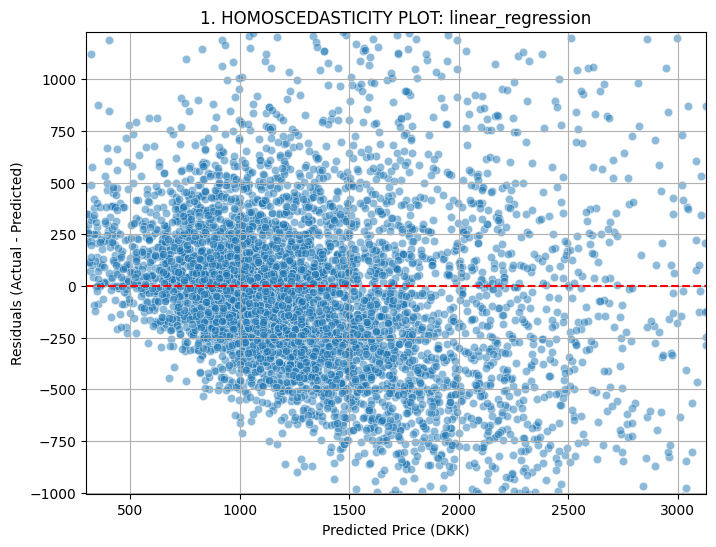


===== SAMPLE PREDICTIONS: linear_regression (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,659.006629,-74.006629
2840,950.0,1104.911942,-154.911942
2052,1623.0,1241.914120,381.085880
4333,2520.0,2666.202300,-146.202300
3005,1212.0,1627.672998,-415.672998
28,1200.0,1091.220139,108.779861
7199,2300.0,1996.619322,303.380678
5269,1543.0,1626.683476,-83.683476
6442,997.0,1050.597408,-53.597408
3164,2001.0,2332.266767,-331.266767



===== TOP 10 POSITIVE RESIDUALS: linear_regression (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8897,63418.0,4107.997665,59310.002335
6976,40629.0,2142.545194,38486.454806
2123,16643.0,5055.931183,11587.068817
7391,9090.0,3289.237024,5800.762976
7320,9810.0,4133.132559,5676.867441
4338,7711.0,2312.842083,5398.157917
1128,8840.0,3628.849841,5211.150159
3562,7977.0,2840.731756,5136.268244
6703,9643.0,4509.520287,5133.479713
9315,6300.0,1985.239893,4314.760107



===== TOP 10 NEGATIVE RESIDUALS: linear_regression (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8994,1572.0,4105.712328,-2533.712328
1550,976.0,2992.360541,-2016.360541
5367,945.0,2874.762000,-1929.762000
5361,657.0,2543.843682,-1886.843682
1544,1112.0,2993.514941,-1881.514941
5982,1153.0,3010.791660,-1857.791660
1541,1792.0,3644.566981,-1852.566981
1547,1241.0,3086.933782,-1845.933782
5789,1500.0,3325.979690,-1825.979690
1873,675.0,2424.859122,-1749.859122


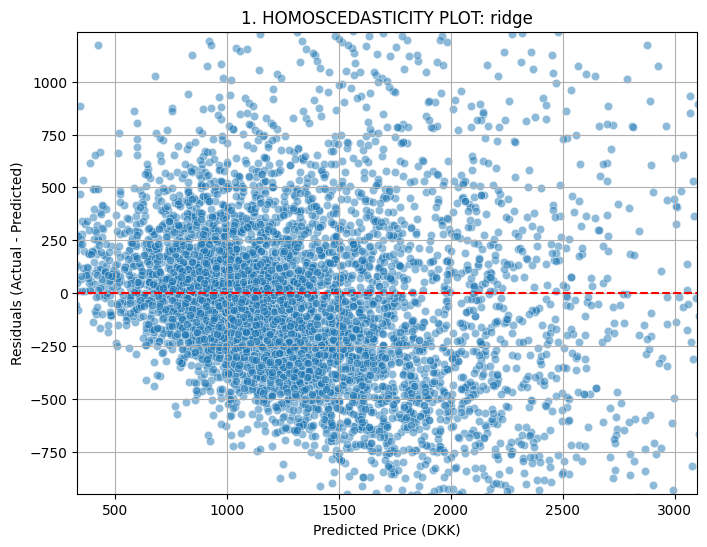


===== SAMPLE PREDICTIONS: ridge (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,664.221009,-79.221009
2840,950.0,1137.993410,-187.993410
2052,1623.0,1224.485215,398.514785
4333,2520.0,2308.071952,211.928048
3005,1212.0,1948.582956,-736.582956
28,1200.0,1122.443909,77.556091
7199,2300.0,1959.847232,340.152768
5269,1543.0,1564.641469,-21.641469
6442,997.0,1054.085302,-57.085302
3164,2001.0,2297.040890,-296.040890



===== TOP 10 POSITIVE RESIDUALS: ridge (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8897,63418.0,3713.055567,59704.944433
6976,40629.0,2138.421868,38490.578132
2123,16643.0,4733.547245,11909.452755
7320,9810.0,3792.825442,6017.174558
7391,9090.0,3250.747140,5839.252860
4338,7711.0,2234.838249,5476.161751
3562,7977.0,2736.260667,5240.739333
1128,8840.0,3601.185526,5238.814474
6703,9643.0,4433.858823,5209.141177
9315,6300.0,1874.067055,4425.932945



===== TOP 10 NEGATIVE RESIDUALS: ridge (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8994,1572.0,3710.598046,-2138.598046
1550,976.0,2959.331489,-1983.331489
1544,1112.0,2978.396513,-1866.396513
5982,1153.0,2977.293574,-1824.293574
1541,1792.0,3614.411493,-1822.411493
1547,1241.0,3061.470707,-1820.470707
1873,675.0,2428.141786,-1753.141786
5367,945.0,2681.128373,-1736.128373
5361,657.0,2387.484191,-1730.484191
1552,1048.0,2765.829481,-1717.829481


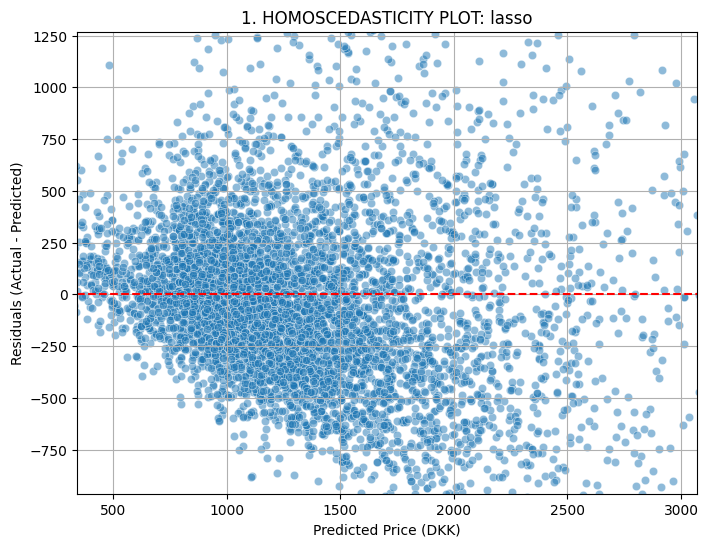


===== SAMPLE PREDICTIONS: lasso (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,679.866507,-94.866507
2840,950.0,1197.703773,-247.703773
2052,1623.0,1195.829037,427.170963
4333,2520.0,2181.514820,338.485180
3005,1212.0,2046.957148,-834.957148
28,1200.0,1167.513313,32.486687
7199,2300.0,1951.729191,348.270809
5269,1543.0,1527.948613,15.051387
6442,997.0,1083.045181,-86.045181
3164,2001.0,2277.274243,-276.274243



===== TOP 10 POSITIVE RESIDUALS: lasso (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8897,63418.0,3561.328122,59856.671878
6976,40629.0,2115.678120,38513.321880
2123,16643.0,4640.050818,12002.949182
7320,9810.0,3685.470932,6124.529068
7391,9090.0,3214.161995,5875.838005
4338,7711.0,2182.288570,5528.711430
3562,7977.0,2566.976145,5410.023855
1128,8840.0,3540.069861,5299.930139
6703,9643.0,4382.101928,5260.898072
9315,6300.0,1774.813064,4525.186936



===== TOP 10 NEGATIVE RESIDUALS: lasso (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8994,1572.0,3558.880935,-1986.880935
1550,976.0,2945.253081,-1969.253081
1544,1112.0,2978.669771,-1866.669771
1547,1241.0,3070.492032,-1829.492032
1552,1048.0,2865.545770,-1817.545770
5367,945.0,2756.438118,-1811.438118
5982,1153.0,2961.469577,-1808.469577
1541,1792.0,3598.134812,-1806.134812
1873,675.0,2434.454385,-1759.454385
1117,1162.0,2913.538180,-1751.538180


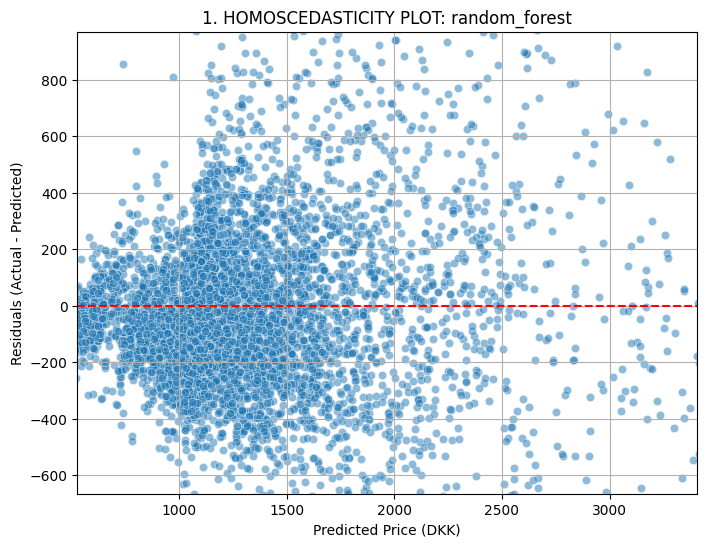


===== SAMPLE PREDICTIONS: random_forest (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,561.694032,23.305968
2840,950.0,1096.886605,-146.886605
2052,1623.0,1162.116371,460.883629
4333,2520.0,1730.298991,789.701009
3005,1212.0,1490.479711,-278.479711
28,1200.0,1062.164170,137.835830
7199,2300.0,2260.183973,39.816027
5269,1543.0,1479.796241,63.203759
6442,997.0,1128.702146,-131.702146
3164,2001.0,1938.718838,62.281162



===== TOP 10 POSITIVE RESIDUALS: random_forest (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8897,63418.0,10525.769779,52892.230221
6976,40629.0,6545.221625,34083.778375
2123,16643.0,6980.581965,9662.418035
7320,9810.0,4390.587679,5419.412321
3562,7977.0,3042.164975,4934.835025
4338,7711.0,2925.670233,4785.329767
9315,6300.0,2344.485206,3955.514794
7391,9090.0,5247.992206,3842.007794
6703,9643.0,6119.774767,3523.225233
923,6641.0,3518.358688,3122.641312



===== TOP 10 NEGATIVE RESIDUALS: random_forest (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8039,2245.0,9810.334339,-7565.334339
5837,1861.0,7430.783411,-5569.783411
1541,1792.0,7052.232928,-5260.232928
1549,2531.0,7194.825650,-4663.825650
8965,2418.0,6637.471930,-4219.471930
8994,1572.0,5650.174406,-4078.174406
2155,2402.0,5686.402505,-3284.402505
5728,1428.0,4239.062151,-2811.062151
7839,1008.0,3464.741056,-2456.741056
1192,2274.0,4487.863960,-2213.863960


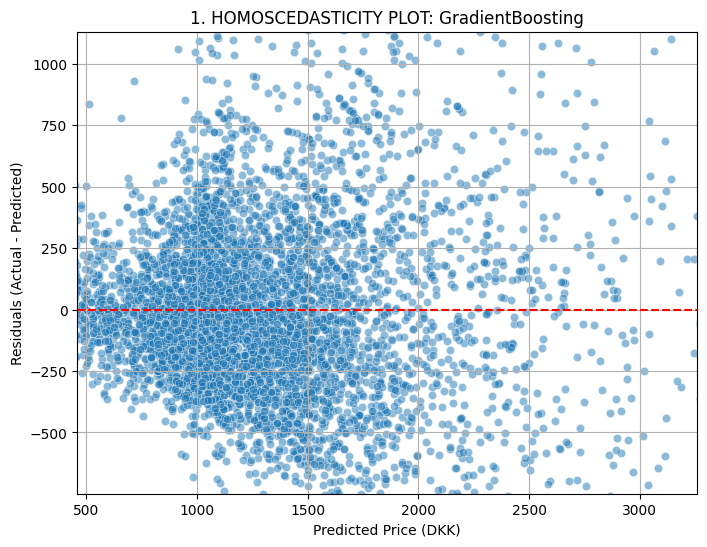


===== SAMPLE PREDICTIONS: GradientBoosting (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,595.867258,-10.867258
2840,950.0,1053.634302,-103.634302
2052,1623.0,1488.449184,134.550816
4333,2520.0,1773.180806,746.819194
3005,1212.0,1769.202625,-557.202625
28,1200.0,1010.223481,189.776519
7199,2300.0,2122.695912,177.304088
5269,1543.0,1577.910952,-34.910952
6442,997.0,1085.529605,-88.529605
3164,2001.0,1675.826655,325.173345



===== TOP 10 POSITIVE RESIDUALS: GradientBoosting (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8897,63418.0,36414.493520,27003.506480
6976,40629.0,35855.940156,4773.059844
3562,7977.0,3824.339357,4152.660643
923,6641.0,3307.069454,3333.930546
6091,5858.0,2834.944864,3023.055136
2378,5162.0,2284.787031,2877.212969
2414,4965.0,2090.566421,2874.433579
4537,5775.0,2940.252422,2834.747578
7391,9090.0,6337.921896,2752.078104
149,4965.0,2231.334237,2733.665763



===== TOP 10 NEGATIVE RESIDUALS: GradientBoosting (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
8994,1572.0,12132.880397,-10560.880397
6506,2660.0,5534.318326,-2874.318326
8484,2418.0,5019.915882,-2601.915882
8171,1360.0,3841.957502,-2481.957502
6920,3328.0,5599.415432,-2271.415432
1192,2274.0,4227.673410,-1953.673410
1545,1330.0,3211.942290,-1881.942290
9424,1472.0,3253.525251,-1781.525251
6553,2208.0,3975.329981,-1767.329981
1873,675.0,2087.356095,-1412.356095


/tmp/ipython-input-3141730061.py:37: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.ylim(resid_lower, resid_upper)


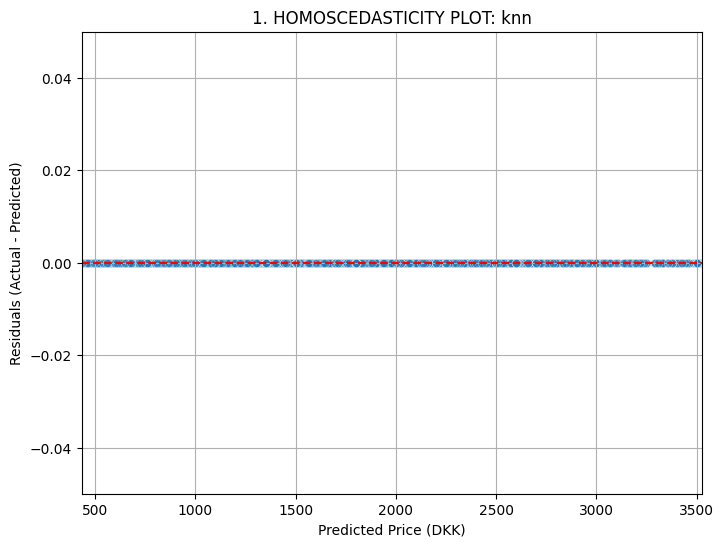


===== SAMPLE PREDICTIONS: knn (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
7392,585.0,585.0,0.0
2840,950.0,950.0,0.0
2052,1623.0,1623.0,0.0
4333,2520.0,2520.0,0.0
3005,1212.0,1212.0,0.0
28,1200.0,1200.0,0.0
7199,2300.0,2300.0,0.0
5269,1543.0,1543.0,0.0
6442,997.0,997.0,0.0
3164,2001.0,2001.0,0.0



===== TOP 10 POSITIVE RESIDUALS: knn (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
6927,3405.0,3175.5,229.5
9277,1863.0,1863.0,0.0
8065,1023.0,1023.0,0.0
9030,1410.0,1410.0,0.0
9597,810.0,810.0,0.0
9497,717.0,717.0,0.0
753,1400.0,1400.0,0.0
489,5500.0,5500.0,0.0
6780,1080.0,1080.0,0.0
5060,2328.0,2328.0,0.0



===== TOP 10 NEGATIVE RESIDUALS: knn (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
6936,2946.0,3175.5,-229.5
2703,700.0,700.0,0.0
9030,1410.0,1410.0,0.0
9597,810.0,810.0,0.0
9497,717.0,717.0,0.0
753,1400.0,1400.0,0.0
489,5500.0,5500.0,0.0
6780,1080.0,1080.0,0.0
5060,2328.0,2328.0,0.0
7839,1008.0,1008.0,0.0


In [156]:
import matplotlib.pyplot as plt
import seaborn as sns

# =================================================================
# HOMOSCEDASTICITY CHECK (VISUAL) FOR ALL MODELS ON TRAINING DATA
# =================================================================

print("Generating homoscedasticity residuals plots and distribution plots for all tuned models...")
print("\n")

# Loop through all models whose best configuration was found via GridSearchCV
for model_name, final_model in best_estimators.items():

    # 1. Generate predictions on the training data
    y_pred_train = final_model.predict(X_train)

    # 2. Calculate residuals
    residuals_train = y_train - y_pred_train

    # 3. Calculate 2nd and 98th percentiles for predicted price to remove outliers
    y_pred_lower = np.quantile(y_pred_train, 0.02)
    y_pred_upper = np.quantile(y_pred_train, 0.98)

    # 4. Calculate 2nd and 98th percentiles for residuals to remove outliers
    resid_lower = np.quantile(residuals_train, 0.02)
    resid_upper = np.quantile(residuals_train, 0.98)

    # --- PLOT 1: Residuals Scatter Plot (Homoscedasticity Check) ---
    plt.figure(figsize=(8, 6)) # Increased size for better visualization
    sns.scatterplot(x=y_pred_train, y=residuals_train, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--') # Add the zero line for reference
    plt.title(f'1. HOMOSCEDASTICITY PLOT: {model_name}')
    plt.xlabel('Predicted Price (DKK)')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.grid(True)
    plt.xlim(y_pred_lower, y_pred_upper)
    plt.ylim(resid_lower, resid_upper)
    plt.show()

    # ---------------------------------------------------------------

    # 5. Show a sample of predictions vs. true values
    comparison_df = pd.DataFrame({
        "Actual Price": y_train,
        "Predicted Price": y_pred_train,
        "Residual (Error)": residuals_train
    })

    print(f"\n===== SAMPLE PREDICTIONS: {model_name} (20 rows) =====")
    try:
        display(comparison_df.sample(n=20, random_state=42))
    except NameError:
        print(comparison_df.sample(n=20, random_state=42))


    # Get the 10 largest POSITIVE residuals (Model UNDER-estimated by the most)
    top_positive_residuals = comparison_df.sort_values(
        by="Residual (Error)", ascending=False
    ).head(10)

    print(f"\n===== TOP 10 POSITIVE RESIDUALS: {model_name} (Model Underestimated) =====")
    try:
        display(top_positive_residuals)
    except NameError:
        print(top_positive_residuals)

    # Get the 10 largest NEGATIVE residuals (Model OVER-estimated by the most)
    top_negative_residuals = comparison_df.sort_values(
        by="Residual (Error)", ascending=True
    ).head(10)

    print(f"\n===== TOP 10 NEGATIVE RESIDUALS: {model_name} (Model Overestimated) =====")
    try:
        display(top_negative_residuals)
    except NameError:
        print(top_negative_residuals)

    print("\n")
    plt.close('all')

# RANK THE MODELS BASED ON TRAINING CV RESULTS

In [151]:
# =======================================
# CREATE SUMMARY TABLE OF MODEL RESULTS
# =======================================

# Convert the list of result dicts into a DataFrame.
# Each row corresponds to one model (linear regression, ridge, lasso, RF, GB)
results_df = pd.DataFrame(results)

# Sort models by their CV MAE (lower is better performance).
# We reset the index so the top model becomes row 0.
results_df = (
    results_df
    .sort_values(by="Best CV MAE", ascending=True)
    .reset_index(drop=True)
)

print("\n===== MODEL COMPARISON (by CV MAE — lower is better) =====")
display(results_df)


===== MODEL COMPARISON (by CV MAE — lower is better) =====


,Model,Best CV MAE,Best CV RMSE,Best CV R²,Best Hyperparams
0,GradientBoosting,359.557896,1115.971718,0.292118,"{'model__learning_rate': 0.1, 'model__n_estima..."
1,random_forest,366.238265,1100.909205,0.343585,"{'model__max_depth': 20, 'model__min_samples_l..."
2,ridge,381.227334,1096.788400,0.353229,{'model__alpha': 10.0}
3,lasso,382.176593,1098.242627,0.351504,{'model__alpha': 1.0}
4,knn,383.969567,1123.070546,0.292268,"{'model__metric': 'manhattan', 'model__n_neigh..."
5,linear_regression,392.500656,1103.503763,0.336102,{}


# EVALUATE ALL MODELS ON HOLD-OUT TEST SET

In [152]:
test_results_list = []

print("\n\n=============================================")
print("EVALUATING ALL MODELS ON HELD-OUT TEST SET")
print("=============================================")

# Loop through every model whose best configuration was found and refit
for model_name, final_model in best_estimators.items():

    # Generate predictions for the held-out test set
    y_pred_test = final_model.predict(X_test)

    # Compute evaluation metrics
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    test_r2 = r2_score(y_test, y_pred_test)

    # Store the results
    test_results_list.append({
        "Model": model_name,
        "Test MAE":  test_mae,
        "Test RMSE": test_rmse,
        "Test R²":   test_r2,
    })

# Create the final results DataFrame
all_test_results_df = pd.DataFrame(test_results_list)
all_test_results_df.set_index("Model", inplace=True)

# Sort by MAE to easily see the best performer on the test set
all_test_results_df.sort_values(by="Test MAE", inplace=True)

display(all_test_results_df)



EVALUATING ALL MODELS ON HELD-OUT TEST SET


,Test MAE,Test RMSE,Test R²
Model,,,
random_forest,345.226849,524.622222,0.614528
GradientBoosting,348.290369,541.786579,0.588892
knn,374.835888,601.659324,0.493008
ridge,377.046145,554.535965,0.569316
lasso,378.070903,559.851243,0.561020
linear_regression,385.700442,563.728280,0.554919


Generating homoscedasticity residuals plots for all tuned models on test data...




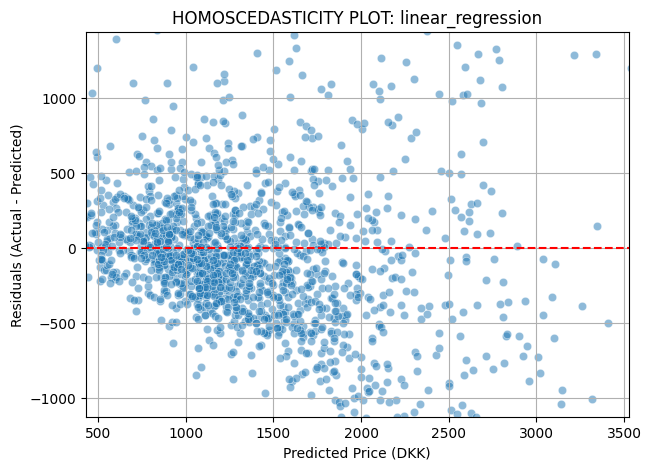


===== SAMPLE PREDICTIONS: linear_regression (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1198.612999,-186.612999
7846,1120.0,1127.651436,-7.651436
5746,1800.0,1514.385402,285.614598
1937,853.0,1188.691930,-335.691930
4034,1264.0,1255.365593,8.634407
2062,1536.0,1280.702486,255.297514
3850,1329.0,1903.587104,-574.587104
3872,1575.0,1476.650260,98.349740
7721,812.0,935.268306,-123.268306
1463,1989.0,1768.768727,220.231273



===== TOP 10 POSITIVE RESIDUALS: linear_regression (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
3950,5276.0,1947.877272,3328.122728
8887,6000.0,3067.313036,2932.686964
3038,7000.0,4078.159840,2921.840160
1826,6358.0,3551.439650,2806.560350
1721,5000.0,2206.101623,2793.898377
2065,5100.0,2350.744645,2749.255355
5221,5510.0,2878.726914,2631.273086
300,5946.0,3385.708098,2560.291902
7929,3600.0,1063.399146,2536.600854
4813,5700.0,3185.129752,2514.870248



===== TOP 10 NEGATIVE RESIDUALS: linear_regression (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
9290,1317.0,3535.433031,-2218.433031
1543,976.0,2756.903659,-1780.903659
5587,1241.0,3007.542055,-1766.542055
1548,1402.0,3128.030661,-1726.030661
398,434.0,2159.806317,-1725.806317
1553,1573.0,3114.770672,-1541.770672
6461,1305.0,2815.724495,-1510.724495
7354,680.0,2188.533343,-1508.533343
3719,2258.0,3744.010338,-1486.010338
1350,1485.0,2917.614901,-1432.614901


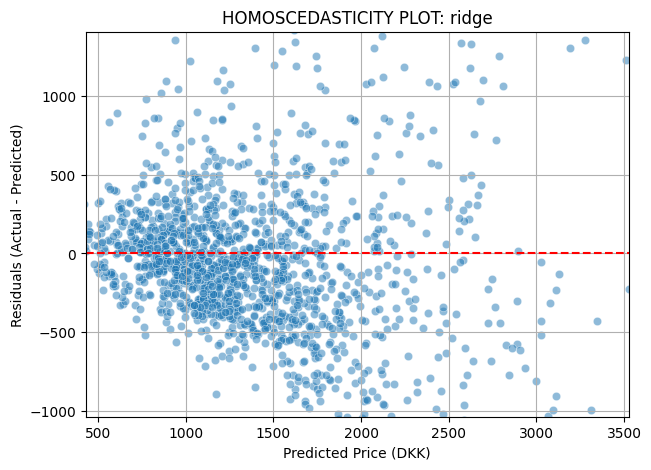


===== SAMPLE PREDICTIONS: ridge (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1197.507654,-185.507654
7846,1120.0,1103.865765,16.134235
5746,1800.0,1536.124692,263.875308
1937,853.0,1181.329641,-328.329641
4034,1264.0,1308.184694,-44.184694
2062,1536.0,1276.629842,259.370158
3850,1329.0,1841.541091,-512.541091
3872,1575.0,1453.367797,121.632203
7721,812.0,950.292955,-138.292955
1463,1989.0,1739.978534,249.021466



===== TOP 10 POSITIVE RESIDUALS: ridge (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
3950,5276.0,1905.799810,3370.200190
1826,6358.0,3042.874117,3315.125883
3038,7000.0,4005.905384,2994.094616
8887,6000.0,3055.258102,2944.741898
2065,5100.0,2320.069072,2779.930928
1721,5000.0,2275.325479,2724.674521
9091,8743.0,6030.692322,2712.307678
5221,5510.0,2874.414807,2635.585193
4813,5700.0,3138.293572,2561.706428
300,5946.0,3396.936993,2549.063007



===== TOP 10 NEGATIVE RESIDUALS: ridge (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
9152,846.0,2995.441912,-2149.441912
1543,976.0,2767.120366,-1791.120366
5587,1241.0,2991.003557,-1750.003557
1548,1402.0,3090.017879,-1688.017879
398,434.0,2055.770890,-1621.770890
9290,1317.0,2933.285343,-1616.285343
1553,1573.0,3076.610285,-1503.610285
1350,1485.0,2987.407570,-1502.407570
1654,1508.0,2922.637032,-1414.637032
5408,1052.0,2444.758283,-1392.758283


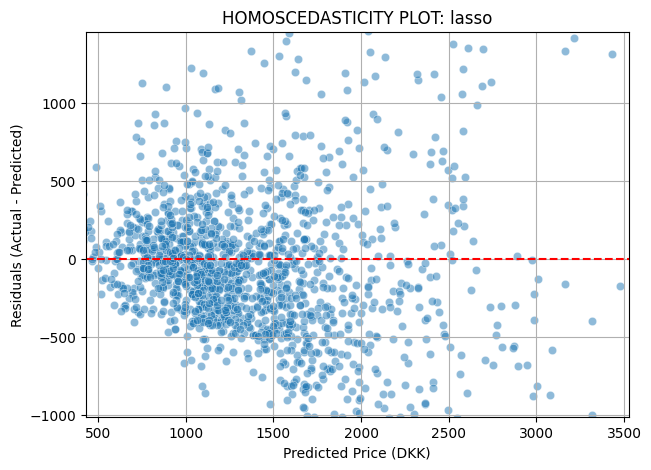


===== SAMPLE PREDICTIONS: lasso (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1160.322319,-148.322319
7846,1120.0,1036.988717,83.011283
5746,1800.0,1550.655115,249.344885
1937,853.0,1182.865938,-329.865938
4034,1264.0,1467.029985,-203.029985
2062,1536.0,1297.213244,238.786756
3850,1329.0,1809.031868,-480.031868
3872,1575.0,1474.464067,100.535933
7721,812.0,953.951500,-141.951500
1463,1989.0,1697.367794,291.632206



===== TOP 10 POSITIVE RESIDUALS: lasso (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
1826,6358.0,2773.116619,3584.883381
3950,5276.0,1869.678505,3406.321495
3038,7000.0,3897.978985,3102.021015
8887,6000.0,3029.015355,2970.984645
9091,8743.0,5961.466838,2781.533162
5221,5510.0,2756.120310,2753.879690
2065,5100.0,2368.497814,2731.502186
1721,5000.0,2326.095157,2673.904843
4813,5700.0,3076.062322,2623.937678
300,5946.0,3406.510402,2539.489598



===== TOP 10 NEGATIVE RESIDUALS: lasso (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
9152,846.0,3220.973694,-2374.973694
1543,976.0,2853.922217,-1877.922217
5587,1241.0,2988.997057,-1747.997057
1548,1402.0,3075.258386,-1673.258386
398,434.0,2023.661229,-1589.661229
2069,210.0,1755.588576,-1545.588576
7863,1805.0,3329.198699,-1524.198699
1350,1485.0,3009.132113,-1524.132113
1553,1573.0,3062.672614,-1489.672614
1654,1508.0,2989.710689,-1481.710689


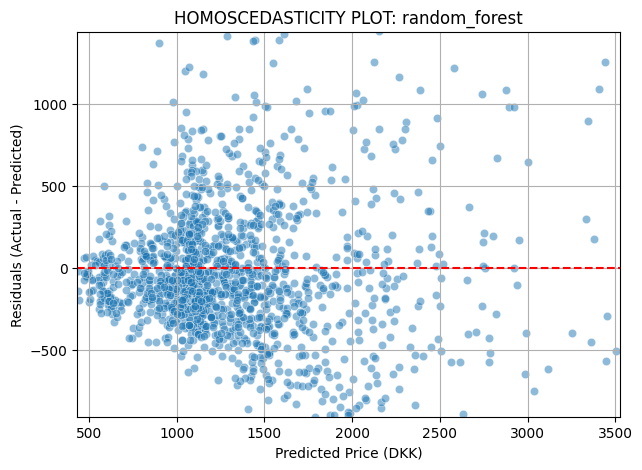


===== SAMPLE PREDICTIONS: random_forest (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1037.173174,-25.173174
7846,1120.0,1076.119588,43.880412
5746,1800.0,1476.335629,323.664371
1937,853.0,1095.959263,-242.959263
4034,1264.0,1667.275281,-403.275281
2062,1536.0,1248.546537,287.453463
3850,1329.0,2002.666786,-673.666786
3872,1575.0,1375.881707,199.118293
7721,812.0,925.192026,-113.192026
1463,1989.0,1681.879730,307.120270



===== TOP 10 POSITIVE RESIDUALS: random_forest (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
3950,5276.0,1768.314870,3507.685130
5221,5510.0,2138.049660,3371.950340
9091,8743.0,5452.788824,3290.211176
2065,5100.0,2191.634198,2908.365802
2831,4500.0,1847.850193,2652.149807
3038,7000.0,4441.379649,2558.620351
3311,4272.0,1736.706289,2535.293711
7929,3600.0,1131.547802,2468.452198
1721,5000.0,2587.605680,2412.394320
8887,6000.0,3590.720204,2409.279796



===== TOP 10 NEGATIVE RESIDUALS: random_forest (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
1654,1508.0,3769.593979,-2261.593979
2510,2191.0,4392.322766,-2201.322766
8218,1436.0,3571.723783,-2135.723783
6660,2156.0,4216.496614,-2060.496614
7863,1805.0,3746.487209,-1941.487209
4924,1530.0,3392.003087,-1862.003087
6554,2103.0,3790.937268,-1687.937268
9290,1317.0,2837.112183,-1520.112183
7989,3202.0,4706.013970,-1504.013970
9405,1658.0,3109.991265,-1451.991265


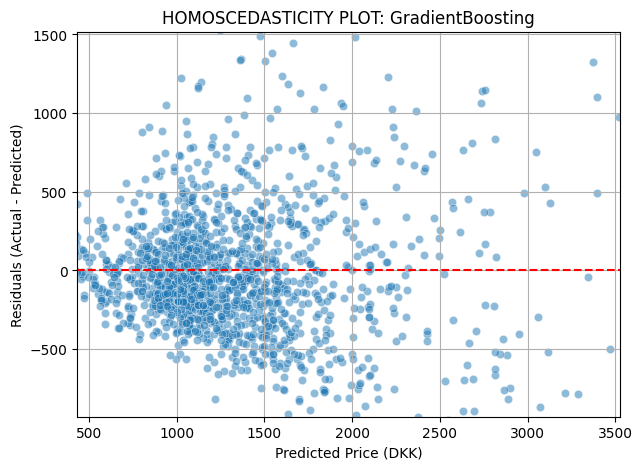


===== SAMPLE PREDICTIONS: GradientBoosting (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1158.299554,-146.299554
7846,1120.0,1086.771270,33.228730
5746,1800.0,1480.312111,319.687889
1937,853.0,1005.171896,-152.171896
4034,1264.0,1597.412841,-333.412841
2062,1536.0,1267.337495,268.662505
3850,1329.0,2149.196168,-820.196168
3872,1575.0,1512.178490,62.821510
7721,812.0,1009.345702,-197.345702
1463,1989.0,1726.682558,262.317442



===== TOP 10 POSITIVE RESIDUALS: GradientBoosting (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
3950,5276.0,1779.916920,3496.083080
2831,4500.0,1649.426593,2850.573407
300,5946.0,3099.655245,2846.344755
1826,6358.0,3553.326230,2804.673770
1721,5000.0,2382.230569,2617.769431
2065,5100.0,2487.755151,2612.244849
8887,6000.0,3407.563571,2592.436429
5221,5510.0,2920.619494,2589.380506
3311,4272.0,1684.063372,2587.936628
9422,1921.0,-664.883454,2585.883454



===== TOP 10 NEGATIVE RESIDUALS: GradientBoosting (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
1654,1508.0,5581.872746,-4073.872746
324,3158.0,6091.814510,-2933.814510
9133,1442.0,4225.623821,-2783.623821
2510,2191.0,4957.755114,-2766.755114
9290,1317.0,3963.461445,-2646.461445
2069,210.0,2177.406025,-1967.406025
6195,2241.0,4053.114212,-1812.114212
4924,1530.0,3144.876508,-1614.876508
9152,846.0,2455.222960,-1609.222960
7989,3202.0,4790.110398,-1588.110398


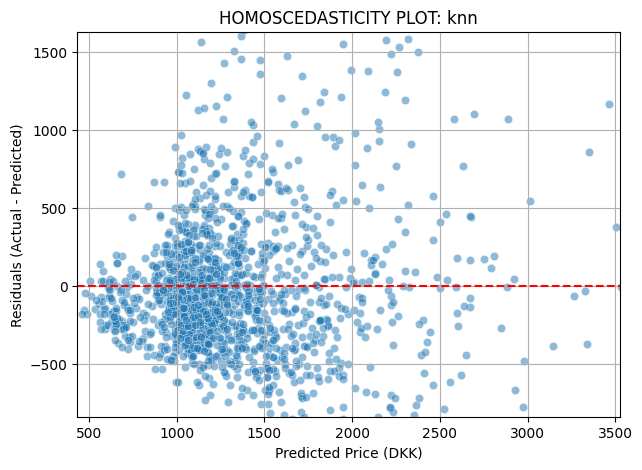


===== SAMPLE PREDICTIONS: knn (20 rows) =====


,Actual Price,Predicted Price,Residual (Error)
3241,1012.0,1208.119371,-196.119371
7846,1120.0,1127.724808,-7.724808
5746,1800.0,1147.990223,652.009777
1937,853.0,1064.376823,-211.376823
4034,1264.0,1406.441387,-142.441387
2062,1536.0,1025.674780,510.325220
3850,1329.0,1872.932814,-543.932814
3872,1575.0,1347.222309,227.777691
7721,812.0,1138.631978,-326.631978
1463,1989.0,1412.412447,576.587553



===== TOP 10 POSITIVE RESIDUALS: knn (Model Underestimated) =====


,Actual Price,Predicted Price,Residual (Error)
9091,8743.0,3740.762282,5002.237718
3950,5276.0,1368.709774,3907.290226
3038,7000.0,3620.093093,3379.906907
8887,6000.0,2808.267859,3191.732141
2065,5100.0,1972.664760,3127.335240
5221,5510.0,2648.052141,2861.947859
3311,4272.0,1469.457433,2802.542567
2831,4500.0,1726.109450,2773.890550
1721,5000.0,2332.660193,2667.339807
1826,6358.0,3701.877593,2656.122407



===== TOP 10 NEGATIVE RESIDUALS: knn (Model Overestimated) =====


,Actual Price,Predicted Price,Residual (Error)
1654,1508.0,7555.877600,-6047.877600
7863,1805.0,5758.256858,-3953.256858
2760,2264.0,6066.282775,-3802.282775
6554,2103.0,4345.737649,-2242.737649
6660,2156.0,4265.131110,-2109.131110
2069,210.0,2285.635000,-2075.635000
324,3158.0,4719.487279,-1561.487279
2076,878.0,2430.988209,-1552.988209
2510,2191.0,3593.914401,-1402.914401
4749,1000.0,2389.087910,-1389.087910


In [158]:
import matplotlib.pyplot as plt
import seaborn as sns

# =================================================================
# HOMOSCEDASTICITY CHECK (VISUAL) FOR ALL MODELS ON TEST DATA
# =================================================================

print("Generating homoscedasticity residuals plots for all tuned models on test data...")
print("\n")

# Loop through all models whose best configuration was found via GridSearchCV
for model_name, final_model in best_estimators.items():

    # 1. Generate predictions on the training data
    y_pred_test = final_model.predict(X_test)

    # 2. Calculate residuals
    residuals_test = y_test - y_pred_test

    # 3. Calculate 2nd and 98th percentiles for predicted price to remove outliers
    y_pred_lower = np.quantile(y_pred_train, 0.02)
    y_pred_upper = np.quantile(y_pred_train, 0.98)

    # 4. Calculate 2nd and 98th percentiles for residuals to remove outliers
    resid_lower = np.quantile(residuals_test, 0.02)
    resid_upper = np.quantile(residuals_test, 0.98)

    # 5. Create the residuals plot
    plt.figure(figsize=(7, 5))
    sns.scatterplot(x=y_pred_test, y=residuals_test, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--') # Add the zero line for reference
    plt.title(f'HOMOSCEDASTICITY PLOT: {model_name}')
    plt.xlabel('Predicted Price (DKK)')
    plt.ylabel('Residuals (Actual - Predicted)')
    plt.grid(True)

    plt.xlim(y_pred_lower, y_pred_upper)
    plt.ylim(resid_lower, resid_upper)

    plt.show()

    #6. Show a sample of predictions vs. true values
    comparison_df = pd.DataFrame({
        "Actual Price": y_test,
        "Predicted Price": y_pred_test,
        "Residual (Error)": residuals_test
    })

    print(f"\n===== SAMPLE PREDICTIONS: {model_name} (20 rows) =====")
    display(comparison_df.sample(n=20, random_state=42))

    # Get the 10 largest POSITIVE residuals (Model UNDER-estimated by the most)
    top_positive_residuals = comparison_df.sort_values(
        by="Residual (Error)", ascending=False
    ).head(10)

    print(f"\n===== TOP 10 POSITIVE RESIDUALS: {model_name} (Model Underestimated) =====")
    try:
        display(top_positive_residuals)
    except NameError:
        print(top_positive_residuals)

    # Get the 10 largest NEGATIVE residuals (Model OVER-estimated by the most)
    top_negative_residuals = comparison_df.sort_values(
        by="Residual (Error)", ascending=True
    ).head(10)

    print(f"\n===== TOP 10 NEGATIVE RESIDUALS: {model_name} (Model Overestimated) =====")
    try:
        display(top_negative_residuals)
    except NameError:
        print(top_negative_residuals)

    print("\n")
    plt.close()

***All the models are somewhat heteroscedastic, showing a trend of larger errors for larger price predictions.***

Given the data we are training our model on, this isn't a deal-breaker. While our models show heteroscedasticity, the distribution of residuals seems to be equally positive and negative. That is, the models aren't biased to predicting a higher-than-actual prices vs. lower-than-actual, or vice-versa. For the errors that our models make, they're roughly equally over- and under-predicted. They do, however, predict higher prices more innacurately (again, by both over- and under-predicting them) than smaller prices, hence the more spread out residuals on the right side of the homoscedasticity plots.

The reality is that the exorbitantly priced listings in the data set might be flawed. For example, the two most expensive listings in our dataset (40,000 & 65,000 DKK/night) both have 2 beds, 2 bathrooms, and accommodate only 4 guests. None of the other attributes are out of the ordinary either, so the pricing seems highly unreasonable. We are willing to accept that our models' prediction errors on these kinds of listings are high.